In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
from scipy.interpolate import interp1d
from numpy.fft import ifft
import time
from tqdm import tqdm
from scipy.spatial import ConvexHull
from matplotlib.patches import Circle

pio.templates.default = "seaborn"
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 11


## Partie 1 : Cas unidimensionnel - Écoulement oscillant $u = \sin(\omega t)$

### Formulation du problème

Le système d'équations différentielles dimensionnelles est :

$$
\left\{\begin{aligned}
\frac{dx_p}{dt} & = v_p\\
\frac{dv_p}{dt} & = \frac{\sin(t) - v_p}{St_w}
\end{aligned}\right.
$$

où :
- $x_p$ : position de la particule
- $v_p$ : vitesse de la particule  
- $St_w$ : nombre de Stokes d'écoulement, défini comme $St_w = \tau_p / \tau_l = \tau_p \omega$
- $\tau_p$ : temps de relaxation de la particule
- $\tau_l$ : temps caractéristique de l'écoulement


In [135]:
def f_particle(t, y, Stw):
    xp, vp = y
    dxp_dt = vp
    dvp_dt = (np.sin(t) - vp) / Stw
    return np.array([dxp_dt, dvp_dt])

In [136]:
def jacobian_particle(Stw):
    return np.array([[0, 1],
                     [0, -1/Stw]])

def plot_sol_particle(Stw_array, tini, tend, yini, tol):

    sol = solve_ivp(f_particle, (tini, tend), yini, method="RK45", 
                    args=(Stw_array[0],), rtol=tol, atol=tol)

    jac = jacobian_particle(Stw_array[0])
    eig_vals = np.linalg.eigvals(jac)
    
    fig = make_subplots(rows=2, cols=3, 
                        specs=[[{"colspan": 2}, None, {}], [{}, {}, {}]],
                        subplot_titles=("Position et Vitesse en fonction du temps", 
                                       "Valeurs propres",
                                       "Portrait de phase", 
                                       "Vitesses vp et u ",
                                       "",
                                       ""))
    
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[0], name='xp', 
                            line=dict(color='blue')), row=1, col=1)
    
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[1], name='vp ', 
                            line=dict(color='red')), row=1, col=1)
    
    fig.add_trace(go.Scatter(x=np.real(eig_vals), y=np.imag(eig_vals), 
                            mode='markers', name='Valeurs propres',
                            marker=dict(symbol='x', size=12, color='purple'),
                            showlegend=False), row=1, col=3)
    fig.add_vline(x=0.0, line_width=1, line_dash="dash", line_color="gray", row=1, col=3)
    fig.add_hline(y=0.0, line_width=1, line_dash="dash", line_color="gray", row=1, col=3)
    
    fig.add_trace(go.Scatter(x=sol.y[0], y=sol.y[1], name='Portrait de phase', 
                            showlegend=False, line=dict(color='green')), 
                 row=2, col=1)
    u = np.sin(sol.t)
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[1], name='vp', 
                            showlegend=False, line=dict(color='red')), 
                 row=2, col=2)
    fig.add_trace(go.Scatter(x=sol.t, y=u, name='vitesse d\'écoulement', 
                            showlegend=False, line=dict(color='blue', dash='dash')), 
                 row=2, col=2)
    steps = []
    for Stw_i in Stw_array:
        sol = solve_ivp(f_particle, (tini, tend), yini, method="RK45", 
                       args=(Stw_i,), rtol=tol, atol=tol)
        u = np.sin(sol.t)
        jac = jacobian_particle(Stw_i)
        eig_vals = np.linalg.eigvals(jac)
        args = [{"x": [sol.t, sol.t, np.real(eig_vals), sol.y[0], sol.t, sol.t], 
                 "y": [sol.y[0], sol.y[1], np.imag(eig_vals), sol.y[1], sol.y[1], u]}]
        step = dict(method="update", label=f"{Stw_i:.3f}", args=args)
        steps.append(step)
    
    sliders = [dict(currentvalue={'prefix': 'Stw = '}, steps=steps)]
    
    fig.update_xaxes(title_text="Temps t", row=1, col=1)
    fig.update_xaxes(title_text="Re(λ)", row=1, col=3)
    fig.update_xaxes(title_text="Position xp", row=2, col=1)
    fig.update_xaxes(title_text="Temps t", row=2, col=2)
    fig.update_yaxes(title_text="Position xp, Vitesse vp", row=1, col=1)
    fig.update_yaxes(title_text="Im(λ)", row=1, col=3)
    fig.update_yaxes(title_text="Vitesse vp", row=2, col=1)
    fig.update_yaxes(title_text="Vitesse vp, u", row=2, col=2)
    fig.update_xaxes(range=[-2, 1], row=1, col=3)
    fig.update_yaxes(range=[-1, 1], row=1, col=3)
    
    legend = dict(x=0.93, bgcolor='rgba(0,0,0,0)')
    fig.update_layout(
        title_text="Résolution du système d'équations différentielles - Cas u = sin(wt)",
        sliders=sliders, 
        height=900, 
        legend=legend
    )
    fig['layout']['sliders'][0]['pad'] = dict(t=50)
    
    fig.show()


In [137]:
Stw_array = np.arange(0.1, 2.0, 0.1)
tini = 0.0
tend = 20.0
yini = (0.0, 0.0)
tol = 1.e-10

plot_sol_particle(Stw_array, tini, tend, yini, tol)


In [138]:
from scipy import signal
from scipy.signal import hilbert

def calculate_phase_shift(t, u, vp):
    u_norm = (u - np.mean(u)) / np.std(u)
    vp_norm = (vp - np.mean(vp)) / np.std(vp)
    u_analytic = hilbert(u_norm)
    vp_analytic = hilbert(vp_norm)
    u_phase = np.unwrap(np.angle(u_analytic))
    vp_phase = np.unwrap(np.angle(vp_analytic))
    start_idx = len(t) // 2
    phase_diff_raw = vp_phase[start_idx:] - u_phase[start_idx:]
    phase_diff_unwrapped = np.unwrap(phase_diff_raw)
    phase_diff = np.mean(phase_diff_unwrapped)
    return np.abs(phase_diff)


In [140]:
def plot_phase_shift(Stw_array, tini, tend, yini, tol):
    phase_shifts = []
    for Stw_i in Stw_array:
        sol = solve_ivp(f_particle, (tini, tend), yini, method="RK45", 
                       args=(Stw_i,), rtol=tol, atol=tol)
        u = np.sin(sol.t)
        phase_shift = calculate_phase_shift(sol.t, u, sol.y[1])
        phase_shifts.append(phase_shift)
    phase_shifts = np.array(phase_shifts)
    phase_shifts_unwrapped = np.unwrap(phase_shifts)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=Stw_array, y=phase_shifts_unwrapped, 
                            mode='lines+markers',
                            name='Déphasage',
                            line=dict(color='blue', width=2),
                            marker=dict(size=6)))
    fig.update_layout(
        title='Déphasage entre u = sin(t) et vp en fonction de Stw',
        xaxis_title='Nombre de Stokes Stw',
        yaxis_title='Déphasage (radians)',
        height=600,
        template='seaborn'
    )
    fig.add_trace(go.Scatter(
        x=Stw_array,
        y=[np.degrees(ps) for ps in phase_shifts_unwrapped],
        mode='markers',
        name='Déphasage (°)',
        yaxis='y2',
        marker=dict(size=0, opacity=0),  
        line=dict(width=0),
        showlegend=False,
        hoverinfo='skip'  
    ))
    
    fig.update_layout(
        yaxis2=dict(
            title="Déphasage (degrés)",
            overlaying="y",
            side="right",
            range=[np.degrees(min(phase_shifts_unwrapped)), np.degrees(max(phase_shifts_unwrapped))]
        )
    )
    
    fig.show()
    
    return Stw_array, phase_shifts_unwrapped


Analyse du déphasage


In [141]:
Stw_array_phase = np.arange(0.01, 100, 1) 
Stw_vals, phase_shifts = plot_phase_shift(Stw_array_phase, tini, tend, yini, tol)


## Partie 2 : Cas spatial - Écoulement $u = u_0 \sin(\kappa x)$

### Formulation du problème

L'équation adimensionnelle dans ce cas s'exprime :

$$
\left\{\begin{aligned}
\frac{dx_p}{dt} & = v_p\\
\frac{dv_p}{dt} & = \frac{\sin(x_p) - v_p}{St_\kappa}
\end{aligned}\right.
$$

où $St_\kappa = \tau_p (u_0 \kappa)$ représente le nombre de Stokes pour ce cas.


In [72]:
def f_particle_kappa(t, y, Stk):
    xp, vp = y
    dxp_dt = vp
    dvp_dt = (np.sin(xp) - vp) / Stk
    return np.array([dxp_dt, dvp_dt])

def jacobian_particle_kappa(Stk, xp_eq=0.0):
    return np.array([[0, 1],
                     [np.cos(xp_eq)/Stk, -1/Stk]])


In [142]:
def plot_sol_particle_kappa(Stk_array, tini, tend, yini, tol):
    sol = solve_ivp(f_particle_kappa, (tini, tend), yini, method="RK45", 
                    args=(Stk_array[0],), rtol=tol, atol=tol)

    jac = jacobian_particle_kappa(Stk_array[0], xp_eq=0.0)
    eig_vals = np.linalg.eigvals(jac)
    fig = make_subplots(rows=2, cols=3, 
                        specs=[[{"colspan": 2}, None, {}], [{}, {}, {}]],
                        subplot_titles=("Position et Vitesse en fonction du temps", 
                                       "Valeurs propres",
                                       "Portrait de phase", 
                                       "Vitesses vp et u ",
                                       "",
                                       ""))
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[0], name='xp (position)', 
                            line=dict(color='blue')), row=1, col=1)

    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[1], name='vp (vitesse)', 
                            line=dict(color='red')), row=1, col=1)
    
    fig.add_trace(go.Scatter(x=np.real(eig_vals), y=np.imag(eig_vals), 
                            mode='markers', name='Valeurs propres',
                            marker=dict(symbol='x', size=12, color='purple'),
                            showlegend=False), row=1, col=3)
    fig.add_vline(x=0.0, line_width=1, line_dash="dash", line_color="gray", row=1, col=3)
    fig.add_hline(y=0.0, line_width=1, line_dash="dash", line_color="gray", row=1, col=3)
    
    fig.add_trace(go.Scatter(x=sol.y[0], y=sol.y[1], name='Portrait de phase', 
                            showlegend=False, line=dict(color='green')), 
                 row=2, col=1)
    
    u = np.sin(sol.y[0])
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[1], name='vp (vitesse particule)', 
                            showlegend=False, line=dict(color='red')), 
                 row=2, col=2)
    fig.add_trace(go.Scatter(x=sol.t, y=u, name='u = sin(xp) (vitesse écoulement)', 
                            showlegend=False, line=dict(color='blue', dash='dash')), 
                 row=2, col=2)
    
    steps = []
    for Stk_i in Stk_array:
        sol = solve_ivp(f_particle_kappa, (tini, tend), yini, method="RK45", 
                       args=(Stk_i,), rtol=tol, atol=tol)
        u = np.sin(sol.y[0])
        # Calculer les valeurs propres
        jac = jacobian_particle_kappa(Stk_i, xp_eq=0.0)
        eig_vals = np.linalg.eigvals(jac)
        # Les args doivent correspondre à l'ordre des traces : 
        # Trace 0: xp vs t, Trace 1: vp vs t, Trace 2: valeurs propres, Trace 3: phase portrait, Trace 4: vp vs t, Trace 5: u vs t
        args = [{"x": [sol.t, sol.t, np.real(eig_vals), sol.y[0], sol.t, sol.t], 
                 "y": [sol.y[0], sol.y[1], np.imag(eig_vals), sol.y[1], sol.y[1], u]}]
        step = dict(method="update", label=f"{Stk_i:.3f}", args=args)
        steps.append(step)
    
    sliders = [dict(currentvalue={'prefix': 'Stκ = '}, steps=steps)]
    
    fig.update_xaxes(title_text="Temps t", row=1, col=1)
    fig.update_xaxes(title_text="Re(λ)", row=1, col=3)
    fig.update_xaxes(title_text="Position xp", row=2, col=1)
    fig.update_xaxes(title_text="Temps t", row=2, col=2)
    fig.update_yaxes(title_text="Position xp, Vitesse vp", row=1, col=1)
    fig.update_yaxes(title_text="Im(λ)", row=1, col=3)
    fig.update_yaxes(title_text="Vitesse vp", row=2, col=1)
    fig.update_yaxes(title_text="Vitesse vp, u", row=2, col=2)
    fig.update_xaxes(range=[-2, 1], row=1, col=3)
    fig.update_yaxes(range=[-1, 1], row=1, col=3)
    
    legend = dict(x=0.93, bgcolor='rgba(0,0,0,0)')
    fig.update_layout(
        title_text="Résolution du système d'équations différentielles - Cas u = u₀ sin(κx)",
        sliders=sliders, 
        height=900, 
        legend=legend
    )
    fig['layout']['sliders'][0]['pad'] = dict(t=50)
    
    fig.show()


In [143]:
Stk_array = np.arange(0.1, 2.0, 0.1)  

tini_kappa = 0.0
tend_kappa = 20.0 
yini_kappa = (1.0, 0.0) 

tol_kappa = 1.e-10

plot_sol_particle_kappa(Stk_array, tini_kappa, tend_kappa, yini_kappa, tol_kappa)


# Troisième partie : Cas général u = u₀ sin(wt + κx)

L'espace adimensionnel et le temps adimensionnel sont choisis comme suit :
- $x' = wt + \kappa x$ (espace adimensionnel)
- $t' = wt$ (temps adimensionnel)

L'équation adimensionnelle dans ce cas s'exprime :

$$
\left\{\begin{aligned}
\frac{dx_p}{dt} & = v_p\\
\frac{dv_p}{dt} & = \frac{1}{St_w}\left[\frac{St_\kappa}{St_w}\sin(x_p) + 1 - v_p\right]
\end{aligned}\right.
$$

où $St_w$ et $St_\kappa$ sont les nombres de Stokes pour ce cas général.


In [76]:
def f_particle_general(t, y, Stw, Stk):
    xp, vp = y
    dxp_dt = vp
    dvp_dt = (1/Stw) * ((Stk/Stw) * np.sin(xp) + 1 - vp)
    return np.array([dxp_dt, dvp_dt])

def jacobian_particle_general(Stw, Stk, xp_eq=0.0):
    return np.array([[0, 1],
                     [(Stk/(Stw*Stw)) * np.cos(xp_eq), -1/Stw]])


In [144]:
def plot_sol_particle_general(Stw_array, Stk_array, tini, tend, yini, tol):
    sol = solve_ivp(f_particle_general, (tini, tend), yini, method="RK45", 
                    args=(Stw_array[0], Stk_array[0]), rtol=tol, atol=tol)
    jac = jacobian_particle_general(Stw_array[0], Stk_array[0], xp_eq=0.0)
    eig_vals = np.linalg.eigvals(jac)
    fig = make_subplots(rows=2, cols=3, 
                        specs=[[{"colspan": 2}, None, {}], [{}, {}, {}]],
                        subplot_titles=("Position et Vitesse en fonction du temps", 
                                       "Valeurs propres ",
                                       "Portrait de phase ", 
                                       "Vitesses vp et u ",
                                       "",
                                       ""))
    
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[0], name='xp (position)', 
                            line=dict(color='blue')), row=1, col=1)
    
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[1], name='vp (vitesse)', 
                            line=dict(color='red')), row=1, col=1)
    
    fig.add_trace(go.Scatter(x=np.real(eig_vals), y=np.imag(eig_vals), 
                            mode='markers', name='Valeurs propres',
                            marker=dict(symbol='x', size=12, color='purple'),
                            showlegend=False), row=1, col=3)
    fig.add_vline(x=0.0, line_width=1, line_dash="dash", line_color="gray", row=1, col=3)
    fig.add_hline(y=0.0, line_width=1, line_dash="dash", line_color="gray", row=1, col=3)
    
    fig.add_trace(go.Scatter(x=sol.y[0], y=sol.y[1], name='Portrait de phase', 
                            showlegend=False, line=dict(color='green')), 
                 row=2, col=1)
    
    u = np.sin(sol.t + sol.y[0])
    fig.add_trace(go.Scatter(x=sol.t, y=sol.y[1], name='vp (vitesse particule)', 
                            showlegend=False, line=dict(color='red')), 
                 row=2, col=2)
    fig.add_trace(go.Scatter(x=sol.t, y=u, name='u = sin(t + xp) (vitesse écoulement)', 
                            showlegend=False, line=dict(color='blue', dash='dash')), 
                 row=2, col=2)

    solutions_dict = {}

    total_combinations = len(Stw_array) * len(Stk_array)
    count = 0
    for Stw_i in Stw_array:
        for Stk_i in Stk_array:
            count += 1
            sol = solve_ivp(f_particle_general, (tini, tend), yini, method="RK45", 
                           args=(Stw_i, Stk_i), rtol=tol, atol=tol)
            u = np.sin(sol.t + sol.y[0])
            jac = jacobian_particle_general(Stw_i, Stk_i, xp_eq=0.0)
            eig_vals = np.linalg.eigvals(jac)
            
            key = (Stw_i, Stk_i)
            solutions_dict[key] = {
                't': sol.t,
                'xp': sol.y[0],
                'vp': sol.y[1],
                'u': u,
                'eig_vals': eig_vals
            }
 
    combined_steps = []
    for Stw_i in Stw_array:
        for Stk_i in Stk_array:
            data = solutions_dict[(Stw_i, Stk_i)]
            args = [{"x": [data['t'], data['t'], np.real(data['eig_vals']), data['xp'], data['t'], data['t']], 
                     "y": [data['xp'], data['vp'], np.imag(data['eig_vals']), data['vp'], data['vp'], data['u']]}]
            step = dict(method="update", label=f"Stw={Stw_i:.2f}, Stκ={Stk_i:.2f}", args=args)
            combined_steps.append(step)
    

    slider_stw_steps = []
    for Stw_i in Stw_array:
        Stk_i = Stk_array[0]  
        data = solutions_dict[(Stw_i, Stk_i)]
        args = [{"x": [data['t'], data['t'], np.real(data['eig_vals']), data['xp'], data['t'], data['t']], 
                 "y": [data['xp'], data['vp'], np.imag(data['eig_vals']), data['vp'], data['vp'], data['u']]}]
        step = dict(method="update", label=f"{Stw_i:.2f}", args=args)
        slider_stw_steps.append(step)
    
    slider_stk_steps = []
    for Stk_i in Stk_array:
        Stw_i = Stw_array[0] 
        data = solutions_dict[(Stw_i, Stk_i)]
        args = [{"x": [data['t'], data['t'], np.real(data['eig_vals']), data['xp'], data['t'], data['t']], 
                 "y": [data['xp'], data['vp'], np.imag(data['eig_vals']), data['vp'], data['vp'], data['u']]}]
        step = dict(method="update", label=f"{Stk_i:.2f}", args=args)
        slider_stk_steps.append(step)
    
    # Créer deux sliders indépendants
    sliders = [
        dict(
            active=0,
            currentvalue={"prefix": "Stw = "},
            pad={"t": 50},
            steps=slider_stw_steps
        ),
        dict(
            active=0,
            currentvalue={"prefix": "Stκ = "},
            pad={"t": 100},
            steps=slider_stk_steps
        )
    ]
    
    fig.update_xaxes(title_text="Temps t", row=1, col=1)
    fig.update_xaxes(title_text="Re(λ)", row=1, col=3)
    fig.update_xaxes(title_text="Position xp", row=2, col=1)
    fig.update_xaxes(title_text="Temps t", row=2, col=2)
    fig.update_yaxes(title_text="Position xp, Vitesse vp", row=1, col=1)
    fig.update_yaxes(title_text="Im(λ)", row=1, col=3)
    fig.update_yaxes(title_text="Vitesse vp", row=2, col=1)
    fig.update_yaxes(title_text="Vitesse vp, u", row=2, col=2)
    fig.update_xaxes(range=[-2, 1], row=1, col=3)
    fig.update_yaxes(range=[-1, 1], row=1, col=3)
    
    legend = dict(x=0.93, bgcolor='rgba(0,0,0,0)')
    fig.update_layout(
        title_text="Résolution du système d'équations différentielles - Cas général",
        sliders=sliders, 
        height=950, 
        legend=legend
    )
    fig['layout']['sliders'][0]['pad'] = dict(t=50)
    
    fig.show()


In [145]:
Stw_array_general = np.arange(0.1, 2.0, 0.2) 
Stk_array_general = np.arange(0.1, 2.0, 0.2)  

tini_general = 0.0
tend_general = 20.0 

yini_general = (0.0, 0.0) 

tol_general = 1.e-10
plot_sol_particle_general(Stw_array_general, Stk_array_general, tini_general, tend_general, yini_general, tol_general)


## Classes pour la simulation d'écoulement turbulent 2D

Cette section définit les classes nécessaires pour générer un champ de vitesse turbulent 2D et simuler le mouvement de particules dans ce champ.

### TurbulentFlow2D

Génère un champ de vitesse turbulent 2D stationnaire et périodique par superposition de modes de Fourier. Le spectre énergétique suit le spectre de Kraichnan pour la turbulence 2D. Chaque mode est caractérisé par un vecteur d'onde et des amplitudes aléatoires.

### ParticleSimulation

Simule le mouvement Lagrangien de particules dans le champ turbulent. Les particules suivent les équations du mouvement avec un temps de relaxation $\tau_p$ qui caractérise l'inertie des particules. Plus $\tau_p$ est petit, plus les particules suivent fidèlement l'écoulement.


DÉMONSTRATION RAPIDE

Cas 1: N_modes = 3 (structure simple)


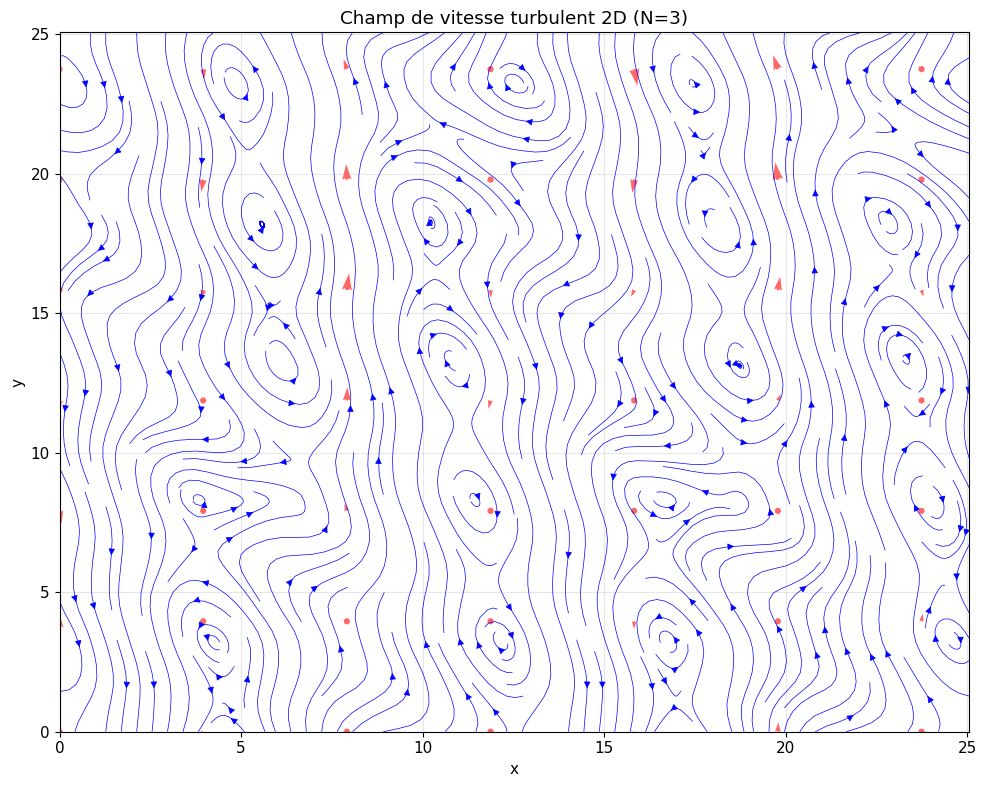

Simulation en cours pour 500 particules...


/var/folders/mt/lngdcthx7pnczp1n1vc1cntc0000gn/T/ipykernel_98412/4078771888.py:127: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/mt/lngdcthx7pnczp1n1vc1cntc0000gn/T/ipykernel_98412/4078771888.py:128: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



Simulation terminée en 138.61 secondes


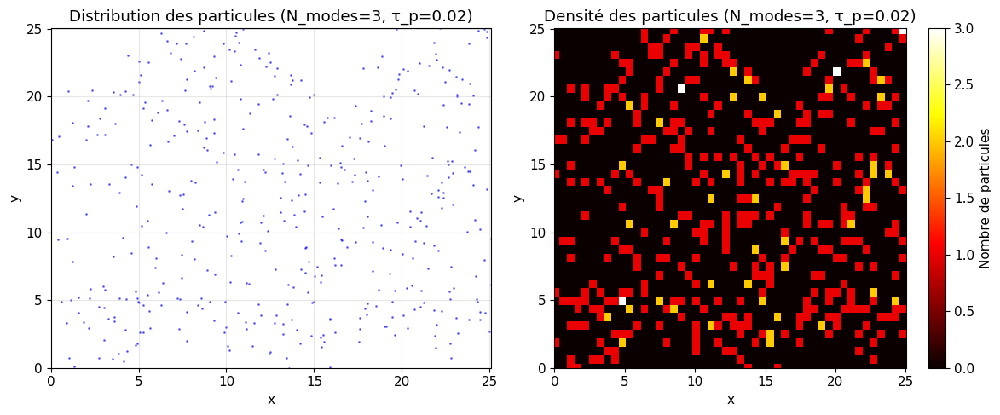


Cas 2: N_modes = 200 (structure complexe)


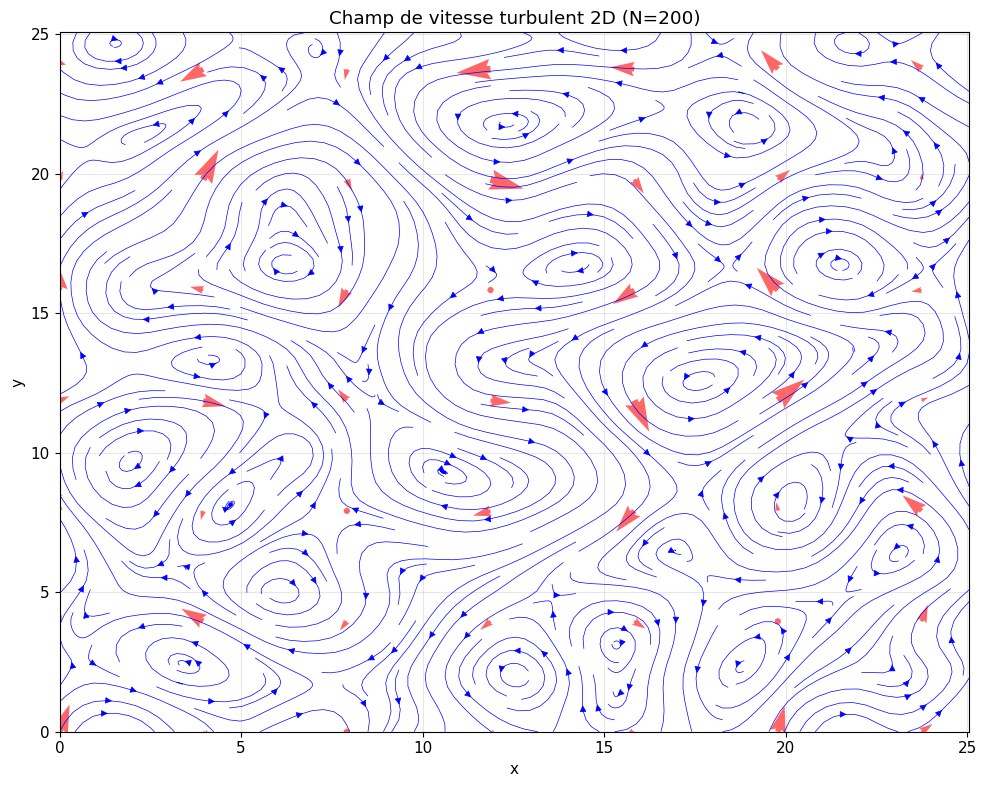

Simulation en cours pour 500 particules...
Simulation terminée en 1377.77 secondes


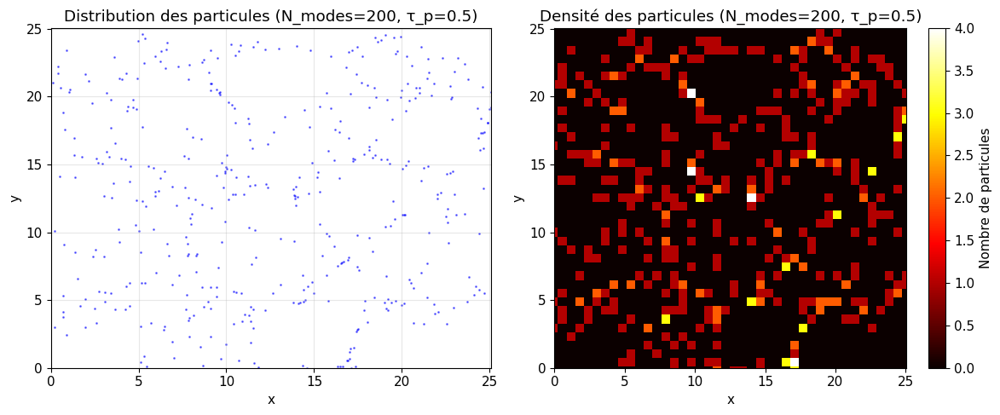

In [146]:
import time
from scipy.integrate import quad

class TurbulentFlow2D:

    def __init__(self, N_modes=200, L=10*np.sqrt(2*np.pi), seed=42):
        self.N_modes = N_modes
        self.L = L
        self.k_scale = np.sqrt(2*np.pi)
        np.random.seed(seed)
        self.generate_modes()
        
    def generate_modes(self):
        self.a = np.zeros((self.N_modes, 3))
        self.b = np.zeros((self.N_modes, 3))
        self.k = np.zeros((self.N_modes, 2))
        self.m = np.zeros((self.N_modes, 2), dtype=int)
        var_a = 3.0 / self.N_modes
        
        for n in range(self.N_modes):
            k_id = self.find_k_id(n + 1)
            M_id = k_id * self.L / (2 * np.pi)
            m1_candidate = np.random.uniform(-M_id, M_id)
            m1 = int(np.floor(m1_candidate)) if m1_candidate >= 0 else int(np.ceil(m1_candidate))
            m2_candidates = np.arange(-int(np.sqrt(M_id**2 - m1**2)), 
                                      int(np.sqrt(M_id**2 - m1**2)) + 1)
            if len(m2_candidates) > 0:
                m2 = m2_candidates[np.argmin(np.abs(np.sqrt(m1**2 + m2_candidates**2) - M_id))]
            else:
                m2 = 0
            if np.random.rand() > 0.5:
                m1, m2 = m2, m1
            self.m[n, 0] = m1
            self.m[n, 1] = m2
            self.k[n, 0] = 2 * np.pi * m1 / self.L
            self.k[n, 1] = 2 * np.pi * m2 / self.L
            norm_a = np.sqrt(var_a) * np.random.randn()
            norm_b = np.sqrt(var_a) * np.random.randn()
            self.a[n] = norm_a * self.random_unit_vector()
            self.b[n] = norm_b * self.random_unit_vector()
    
    def random_unit_vector(self):
        while True:
            xi = np.random.uniform(-1, 1, 3)
            rho2 = np.sum(xi**2)
            if rho2 <= 1:
                return xi / np.sqrt(rho2)
    
    def find_k_id(self, n):
        target = (n - 0.5) / self.N_modes
        def integrand(k):
            return (64/np.sqrt(18*np.pi)) * k**4 * np.exp(-2*k**2)
        k_min, k_max = 0, 10
        for _ in range(100):
            k_mid = (k_min + k_max) / 2
            integral, _ = quad(integrand, 0, k_mid)
            if integral < target:
                k_min = k_mid
            else:
                k_max = k_mid
        return (k_min + k_max) / 2
    
    def velocity_field(self, x, y, t=0):
        x = np.atleast_1d(x)
        y = np.atleast_1d(y)
        u = np.zeros_like(x)
        v = np.zeros_like(x)
        
        for n in range(self.N_modes):
            kx, ky = self.k[n]
            k_norm = np.sqrt(kx**2 + ky**2)
            
            if k_norm > 0:
                a_cross_k = np.cross(self.a[n], [kx, ky, 0])
                b_cross_k = np.cross(self.b[n], [kx, ky, 0])
                phase = kx * x + ky * y
                u += (a_cross_k[0]/k_norm * np.cos(phase) + 
                      b_cross_k[0]/k_norm * np.sin(phase))
                v += (a_cross_k[1]/k_norm * np.cos(phase) + 
                      b_cross_k[1]/k_norm * np.sin(phase))
        
        return u, v
    
    def plot_velocity_field(self, resolution=50):
        x = np.linspace(0, self.L, resolution)
        y = np.linspace(0, self.L, resolution)
        X, Y = np.meshgrid(x, y)
        U, V = self.velocity_field(X.flatten(), Y.flatten())
        U = U.reshape(X.shape)
        V = V.reshape(X.shape)
        plt.figure(figsize=(10, 8))
        plt.streamplot(X, Y, U, V, density=2, color='b', linewidth=0.5)
        plt.quiver(X[::3, ::3], Y[::3, ::3], U[::3, ::3], V[::3, ::3], 
                   scale=50, color='r', alpha=0.6)
        plt.title(f'Champ de vitesse turbulent 2D (N={self.N_modes})')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.xlim(0, self.L)
        plt.ylim(0, self.L)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        return X, Y, U, V


class ParticleSimulation:
    def __init__(self, flow_field, N_particles=10000, tau_p=0.1):
        self.flow = flow_field
        self.N_particles = N_particles
        self.tau_p = tau_p
        self.initialize_particles()
        
    def initialize_particles(self):
        self.positions = np.random.rand(self.N_particles, 2) * self.flow.L
        self.velocities = np.zeros((self.N_particles, 2))
        
    def equations_of_motion(self, t, y):
        particles = y.reshape(-1, 4)
        N = particles.shape[0]
        dxdt = np.zeros_like(particles)
        
        for i in range(N):
            x, y, vx, vy = particles[i]
            dxdt[i, 0] = vx
            dxdt[i, 1] = vy
            u, v = self.flow.velocity_field(x, y, t)
            dxdt[i, 2] = (u - vx) / self.tau_p
            dxdt[i, 3] = (v - vy) / self.tau_p
        
        return dxdt.flatten()
    
    def simulate(self, t_end=10.0, dt=0.01, method='RK45'):
        print(f"Simulation en cours pour {self.N_particles} particules...")
        start_time = time.time()
        t_eval = np.arange(0, t_end, dt)
        y0 = np.column_stack([self.positions, self.velocities]).flatten()
        sol = solve_ivp(
            self.equations_of_motion,
            [0, t_end],
            y0,
            method=method,
            t_eval=t_eval,
            rtol=1e-6,
            atol=1e-9,
            vectorized=False
        )
        N_times = len(sol.t)
        trajectories = sol.y.T.reshape(N_times, self.N_particles, 4)
        self.positions = trajectories[-1, :, :2]
        self.velocities = trajectories[-1, :, 2:]
        elapsed_time = time.time() - start_time
        print(f"Simulation terminée en {elapsed_time:.2f} secondes")
        return sol.t, trajectories
    
    def plot_particle_distribution(self, t_index=-1, trajectories=None, 
                                   title_suffix=""):
        plt.figure(figsize=(12, 5))
        
        if trajectories is not None:
            positions = trajectories[t_index, :, :2]
        else:
            positions = self.positions
        
        plt.subplot(1, 2, 1)
        plt.scatter(positions[:, 0], positions[:, 1], 
                   c='blue', alpha=0.5, s=1)
        plt.title(f'Distribution des particules {title_suffix}')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.xlim(0, self.flow.L)
        plt.ylim(0, self.flow.L)
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        plt.hist2d(positions[:, 0], positions[:, 1], 
                  bins=50, cmap='hot')
        plt.colorbar(label='Nombre de particules')
        plt.title(f'Densité des particules {title_suffix}')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.xlim(0, self.flow.L)
        plt.ylim(0, self.flow.L)
        
        plt.tight_layout()
        plt.show()
    
    def analyze_statistics(self, trajectories, t):
        positions = trajectories[:, :, :2]
        velocities = trajectories[:, :, 2:]
        radii_95 = []
        for i in range(len(t)):
            center = np.array([self.flow.L/2, self.flow.L/2])
            distances = np.linalg.norm(positions[i] - center, axis=1)
            radii_95.append(np.percentile(distances, 95))
        v_rms = np.std(velocities, axis=1)
        v_rms_mean = np.mean(v_rms, axis=1)
        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        axes[0, 0].plot(t, radii_95, 'b-', linewidth=2)
        axes[0, 0].set_xlabel('Temps')
        axes[0, 0].set_ylabel('Rayon (95% des particules)')
        axes[0, 0].set_title('Évolution du rayon de dispersion')
        axes[0, 0].grid(True, alpha=0.3)
        axes[0, 1].plot(t, v_rms_mean, 'r-', linewidth=2)
        axes[0, 1].set_xlabel('Temps')
        axes[0, 1].set_ylabel('Vitesse RMS')
        axes[0, 1].set_title('Évolution de la vitesse turbulente')
        axes[0, 1].grid(True, alpha=0.3)
        final_velocities = velocities[-1].flatten()
        axes[1, 0].hist(final_velocities, bins=50, density=True, 
                       alpha=0.7, color='green')
        axes[1, 0].set_xlabel('Vitesse')
        axes[1, 0].set_ylabel('Densité de probabilité')
        axes[1, 0].set_title('Distribution des vitesses finales')
        axes[1, 0].grid(True, alpha=0.3)
        from scipy.fft import fft2, fftfreq
        pos_grid = np.histogram2d(positions[-1, :, 0], positions[-1, :, 1], 
                                 bins=64, range=[[0, self.flow.L], [0, self.flow.L]])[0]
        fft_result = np.abs(fft2(pos_grid))
        kx = fftfreq(pos_grid.shape[0], d=self.flow.L/pos_grid.shape[0])
        ky = fftfreq(pos_grid.shape[1], d=self.flow.L/pos_grid.shape[1])
        k_radial = np.sqrt(kx[:, np.newaxis]**2 + ky[np.newaxis, :]**2)
        fft_radial = fft_result.flatten()
        k_radial_flat = k_radial.flatten()
        k_bins = np.linspace(0, np.max(k_radial), 50)
        fft_mean = np.zeros_like(k_bins)
        for i in range(len(k_bins)-1):
            mask = (k_radial_flat >= k_bins[i]) & (k_radial_flat < k_bins[i+1])
            if np.any(mask):
                fft_mean[i] = np.mean(fft_radial[mask])
        axes[1, 1].loglog(k_bins[:-1], fft_mean[:-1], 'b.-')
        axes[1, 1].set_xlabel('Nombre d\'onde k')
        axes[1, 1].set_ylabel('Spectre de densité')
        axes[1, 1].set_title('Spectre spatial des positions')
        axes[1, 1].grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        return radii_95, v_rms_mean


def main():
    N_modes = 200
    N_particles = 1000
    L = 10 * np.sqrt(2 * np.pi)
    t_end = 10.0
    dt = 0.1
    
    print("=" * 60)
    print("SIMULATION DE PARTICULES DANS UN ÉCOULEMENT TURBULENT 2D")
    print("=" * 60)
    print(f"Nombre de modes Fourier: {N_modes}")
    print(f"Nombre de particules: {N_particles}")
    print(f"Taille du domaine: L = {L:.2f}")
    print(f"Temps de simulation: t_end = {t_end}")
    print("=" * 60)
    
    print("\n1. Génération du champ turbulent...")
    flow = TurbulentFlow2D(N_modes=N_modes, L=L, seed=42)
    flow.plot_velocity_field(resolution=30)
    
    tau_p_values = [0.02, 0.5, 0.2, 2.0]
    results = {}
    
    for i, tau_p in enumerate(tau_p_values):
        print(f"\n{'='*60}")
        print(f"Simulation {i+1}/{len(tau_p_values)}: τ_p = {tau_p}")
        print(f"{'='*60}")
        
        sim = ParticleSimulation(flow, N_particles=N_particles, tau_p=tau_p)
        t, trajectories = sim.simulate(t_end=t_end, dt=dt, method='RK45')
        sim.plot_particle_distribution(
            trajectories=trajectories,
            title_suffix=f"(τ_p = {tau_p}, t = {t_end}s)"
        )
        radii_95, v_rms = sim.analyze_statistics(trajectories, t)
        results[tau_p] = {
            'trajectories': trajectories,
            't': t,
            'radii_95': radii_95,
            'v_rms': v_rms,
            'final_positions': trajectories[-1, :, :2]
        }
    
    print(f"\n{'='*60}")
    print("COMPARAISON DES RÉSULTATS POUR DIFFÉRENTS τ_p")
    print(f"{'='*60}")
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    for tau_p, data in results.items():
        plt.plot(data['t'], data['radii_95'], label=f'τ_p = {tau_p}', linewidth=2)
    plt.xlabel('Temps')
    plt.ylabel('Rayon (95% des particules)')
    plt.title('Dispersion spatiale pour différents τ_p')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    tau_p_list = []
    v_rms_final = []
    for tau_p, data in results.items():
        tau_p_list.append(tau_p)
        v_rms_final.append(data['v_rms'][-1])
    
    plt.plot(tau_p_list, v_rms_final, 'bo-', linewidth=2, markersize=8)
    plt.xlabel('τ_p (temps de relaxation)')
    plt.ylabel('Vitesse RMS finale')
    plt.title('Vitesse turbulente en fonction de τ_p')
    plt.grid(True, alpha=0.3)
    plt.xscale('log')
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*60)
    print("SIMULATION TERMINÉE AVEC SUCCÈS!")
    print("="*60)


def quick_demo():
    print("DÉMONSTRATION RAPIDE")
    print("="*60)
    
    print("\nCas 1: N_modes = 3 (structure simple)")
    flow_simple = TurbulentFlow2D(N_modes=3, L=10*np.sqrt(2*np.pi), seed=42)
    flow_simple.plot_velocity_field(resolution=20)
    
    sim_small = ParticleSimulation(flow_simple, N_particles=500, tau_p=0.02)
    t1, traj1 = sim_small.simulate(t_end=5.0, dt=0.2)
    sim_small.plot_particle_distribution(
        trajectories=traj1,
        title_suffix="(N_modes=3, τ_p=0.02)"
    )
    
    print("\nCas 2: N_modes = 200 (structure complexe)")
    flow_complex = TurbulentFlow2D(N_modes=200, L=10*np.sqrt(2*np.pi), seed=123)
    flow_complex.plot_velocity_field(resolution=20)
    
    sim_large = ParticleSimulation(flow_complex, N_particles=500, tau_p=0.5)
    t2, traj2 = sim_large.simulate(t_end=5.0, dt=0.2)
    sim_large.plot_particle_distribution(
        trajectories=traj2,
        title_suffix="(N_modes=200, τ_p=0.5)"
    )


if __name__ == "__main__":
    run_full_simulation = False
    
    if run_full_simulation:
        main()
    else:
        quick_demo()

## 2. Simulation de particules dans un écoulement turbulent 2D stationnaire et périodique

Simulation Lagrangienne de 10000 particules bien réparties dans un carré avec vitesse initiale nulle.


In [147]:
import matplotlib.pyplot as plt
from scipy.integrate import quad

def initialize_particles_grid(N_particles, L):
    """
    Initialise N_particles particules bien réparties dans un carré L×L
    Utilise une grille régulière (sqrt(N_particles) × sqrt(N_particles))
    
    """

    grid_size = int(np.sqrt(N_particles))
    if grid_size * grid_size != N_particles:
        raise ValueError(f"N_particles doit être un carré parfait, reçu {N_particles}")
    
    x = np.linspace(L/(2*grid_size), L - L/(2*grid_size), grid_size)
    y = np.linspace(L/(2*grid_size), L - L/(2*grid_size), grid_size)
    X, Y = np.meshgrid(x, y)
    positions = np.column_stack([X.flatten(), Y.flatten()])
    return positions


In [148]:
def simulate_particles_final_distribution(N_modes, tau_p, N_particles=10000, L=None, 
                                         t_end=10.0, dt=0.1, seed=42):
    """
    Simule des particules dans un écoulement turbulent et retourne la distribution finale
    
    """
    if L is None:
        L = 10 * np.sqrt(2 * np.pi)
    
    flow = TurbulentFlow2D(N_modes=N_modes, L=L, seed=seed)
    sim = ParticleSimulation(flow, N_particles=N_particles, tau_p=tau_p)
    sim.positions = initialize_particles_grid(N_particles, L)
    sim.velocities = np.zeros((N_particles, 2)) 
    print(f"Simulation: N_modes={N_modes}, tau_p={tau_p}, N_particles={N_particles}")
    t, trajectories = sim.simulate(t_end=t_end, dt=dt, method='RK45')
    final_positions = trajectories[-1, :, :2]
    return final_positions, flow


In [154]:
def plot_final_distribution(positions, flow, title_suffix=""):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    axes[0].scatter(positions[:, 0], positions[:, 1], 
                   c='blue', alpha=0.9, s=4.0, edgecolors='none', marker='o')
    axes[0].set_title(f'Distribution finale des particules {title_suffix}', 
                      fontsize=13, fontweight='normal', pad=10)
    axes[0].set_xlabel('X', fontsize=12, fontweight='normal')
    axes[0].set_ylabel('Y', fontsize=12, fontweight='normal')
    axes[0].set_xlim(0, flow.L)
    axes[0].set_ylim(0, flow.L)
    axes[0].set_aspect('equal')
    axes[0].grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    axes[0].spines['top'].set_visible(False)
    axes[0].spines['right'].set_visible(False)
    
    hist, xedges, yedges = np.histogram2d(positions[:, 0], positions[:, 1], 
                                          bins=50, range=[[0, flow.L], [0, flow.L]])
    im = axes[1].imshow(hist.T, origin='lower', extent=[0, flow.L, 0, flow.L], 
                       cmap='hot', interpolation='nearest')
    axes[1].set_title(f'Densité des particules {title_suffix}', 
                      fontsize=13, fontweight='normal', pad=10)
    axes[1].set_xlabel('X', fontsize=12, fontweight='normal')
    axes[1].set_ylabel('Y', fontsize=12, fontweight='normal')
    axes[1].set_aspect('equal')
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)
    cbar = plt.colorbar(im, ax=axes[1], label='Nombre de particules')
    cbar.ax.tick_params(labelsize=10)
    
    plt.tight_layout()
    plt.show()


SIMULATION DE PARTICULES DANS UN ÉCOULEMENT TURBULENT 2D
Nombre de particules: 10000 (grille 100×100)
Taille du domaine: L = 25.07
Temps de simulation: t_end = 10.0

Cas 1/2: N=3, τ_p=0.2
Simulation: N_modes=3, tau_p=0.2, N_particles=10000
Simulation en cours pour 10000 particules...


/var/folders/mt/lngdcthx7pnczp1n1vc1cntc0000gn/T/ipykernel_98412/4078771888.py:127: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/mt/lngdcthx7pnczp1n1vc1cntc0000gn/T/ipykernel_98412/4078771888.py:128: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



Simulation terminée en 16521.15 secondes


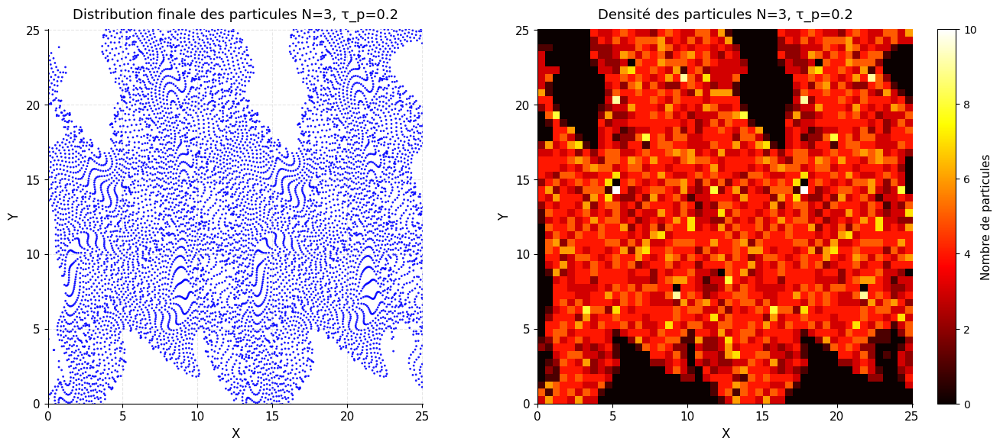


Cas 2/2: N=3, τ_p=2.0
Simulation: N_modes=3, tau_p=2.0, N_particles=10000
Simulation en cours pour 10000 particules...
Simulation terminée en 282.58 secondes


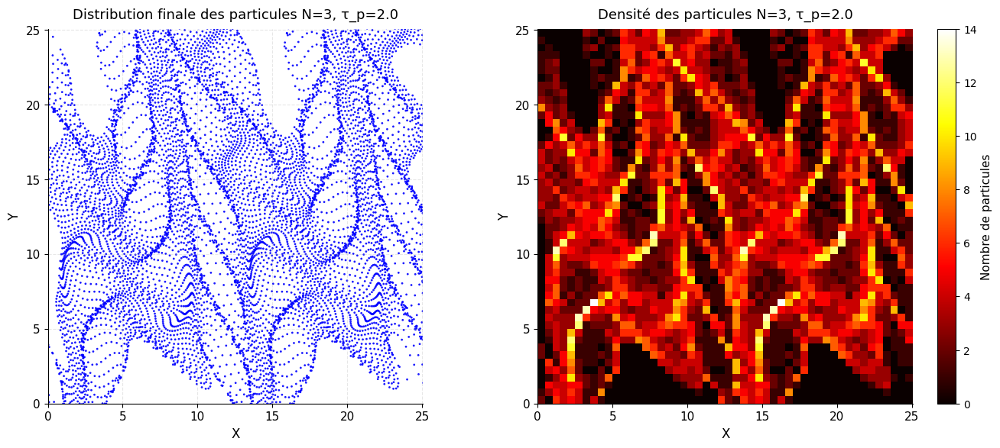


SIMULATION TERMINÉE!


In [155]:
N_particles = 10000 
L = 10 * np.sqrt(2 * np.pi)
t_end = 10.0 
dt = 0.1  

cases = [
    {'N_modes': 3, 'tau_p': 0.2, 'name': 'N=3, τ_p=0.2'},
    {'N_modes': 3, 'tau_p': 2.0, 'name': 'N=3, τ_p=2.0'},
]

results = {}

print("="*70)
print("SIMULATION DE PARTICULES DANS UN ÉCOULEMENT TURBULENT 2D")
print("="*70)
print(f"Nombre de particules: {N_particles} (grille {int(np.sqrt(N_particles))}×{int(np.sqrt(N_particles))})")
print(f"Taille du domaine: L = {L:.2f}")
print(f"Temps de simulation: t_end = {t_end}")
print("="*70)

for i, case in enumerate(cases):
    print(f"\n{'='*70}")
    print(f"Cas {i+1}/{len(cases)}: {case['name']}")
    print(f"{'='*70}")
    
    final_pos, flow = simulate_particles_final_distribution(
        N_modes=case['N_modes'],
        tau_p=case['tau_p'],
        N_particles=N_particles,
        L=L,
        t_end=t_end,
        dt=dt,
        seed=42
    )
    
    plot_final_distribution(final_pos, flow, title_suffix=case['name'])
    results[case['name']] = {
        'positions': final_pos,
        'flow': flow,
        'N_modes': case['N_modes'],
        'tau_p': case['tau_p']
    }

print("\n" + "="*70)
print("SIMULATION TERMINÉE!")
print("="*70)


In [150]:
def simulate_single_particle(flow, pos_init, vit_init, tau_p, t_end=10.0, dt=0.01):
    """
    Simule le mouvement d'une seule particule dans un champ turbulent

    """
    def equations_of_motion(t, y):
        x, y_pos, vx, vy = y
        u, v = flow.velocity_field(x, y_pos, t)
        u = np.asarray(u).flatten()[0]
        v = np.asarray(v).flatten()[0]
        
        dxdt = vx
        dydt = vy
        dvxdt = (u - vx) / tau_p
        dvydt = (v - vy) / tau_p
        
        return np.array([dxdt, dydt, dvxdt, dvydt])
    
    y0 = np.array([pos_init[0], pos_init[1], vit_init[0], vit_init[1]])
    t_eval = np.arange(0, t_end, dt)
    sol = solve_ivp(
        equations_of_motion,
        [0, t_end],
        y0,
        method='RK45',
        t_eval=t_eval,
        rtol=1e-6,
        atol=1e-9
    )

    positions = sol.y[:2, :].T 
    velocities = sol.y[2:, :].T  
    
    return sol.t, positions, velocities


In [158]:
def plot_trajectory_on_field(positions, flow, title_suffix="", resolution=50):
    """
    Visualise la trajectoire de la particule superposée sur le champ de vitesse

    """

    x_min, x_max = np.min(positions[:, 0]), np.max(positions[:, 0])
    y_min, y_max = np.min(positions[:, 1]), np.max(positions[:, 1])
    margin = 0.1 * max(x_max - x_min, y_max - y_min, flow.L)
    
    x_range = [min(x_min - margin, -flow.L), max(x_max + margin, flow.L)]
    y_range = [min(y_min - margin, -flow.L), max(y_max + margin, flow.L)]
    
    x = np.linspace(x_range[0], x_range[1], resolution)
    y = np.linspace(y_range[0], y_range[1], resolution)
    X, Y = np.meshgrid(x, y)

    U, V = flow.velocity_field(X.flatten(), Y.flatten())
    
    U = np.asarray(U).reshape(X.shape)
    V = np.asarray(V).reshape(X.shape)
    
    fig, ax = plt.subplots(figsize=(10, 10))

    ax.streamplot(X, Y, U, V, density=2, color='lightblue', linewidth=0.5)
    
    ax.plot(positions[:, 0], positions[:, 1], 'r-', linewidth=2.0, alpha=0.9, label='Trajectoire', zorder=3)
    ax.plot(positions[0, 0], positions[0, 1], 'go', markersize=6, label='Début', zorder=5, 
            markeredgecolor='darkgreen', markeredgewidth=1.5)
    ax.plot(positions[-1, 0], positions[-1, 1], 'ro', markersize=8, label='Fin', zorder=5,
            markeredgecolor='darkred', markeredgewidth=1.5)
    
    ax.set_xlabel('Position $x$', fontsize=13, fontweight='normal')
    ax.set_ylabel('Position $y$', fontsize=13, fontweight='normal')
    ax.set_title(f'Trajectoire de la particule sur le champ de vitesse {title_suffix}', 
                 fontsize=14, fontweight='normal', pad=15)
    ax.set_xlim(x_range[0], x_range[1])
    ax.set_ylim(y_range[0], y_range[1])
    ax.set_aspect('equal')
    ax.axhline(y=0, color='k', linewidth=0.8, linestyle='-', alpha=0.3)
    ax.axvline(x=0, color='k', linewidth=0.8, linestyle='-', alpha=0.3)
    ax.grid(True, alpha=0.25, linestyle='--', linewidth=0.8)
    ax.legend(loc='upper right', fontsize=11, framealpha=0.9, edgecolor='gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.show()

def plot_phase_portrait(velocities, title_suffix=""):
    """
    Visualise le portrait de phase (vx vs vy) - style scientifique simple

    """
    fig, ax = plt.subplots(figsize=(8, 8))
    
    ax.plot(velocities[:, 0], velocities[:, 1], 'b-', linewidth=2.0, alpha=0.8, 
            label='Trajectoire de phase', zorder=2)
    ax.plot(velocities[0, 0], velocities[0, 1], 'go', markersize=6, label='Début', zorder=5,
            markeredgecolor='darkgreen', markeredgewidth=1.5)
    ax.plot(velocities[-1, 0], velocities[-1, 1], 'ro', markersize=8, label='Fin', zorder=5,
            markeredgecolor='darkred', markeredgewidth=1.5)
    
    ax.set_xlabel('Vitesse $v_x$', fontsize=13, fontweight='normal')
    ax.set_ylabel('Vitesse $v_y$', fontsize=13, fontweight='normal')
    ax.set_title(f'Portrait de phase {title_suffix}', fontsize=14, fontweight='normal', pad=15)
    ax.grid(True, alpha=0.25, linestyle='--', linewidth=0.8)
    ax.legend(loc='upper right', fontsize=11, framealpha=0.9, edgecolor='gray')
    ax.axis('equal')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.show()


SIMULATION D'UNE PARTICULE UNIQUE DANS UN ÉCOULEMENT TURBULENT 2D
Position initiale: (12.53, 12.53)
Vitesse initiale: (0.00, 0.00)
Temps de relaxation τ_p: 0.1
Temps de simulation: t_end = 30.0

Cas N = 3
Simulation en cours...
Affichage de la trajectoire sur le champ de vitesse...


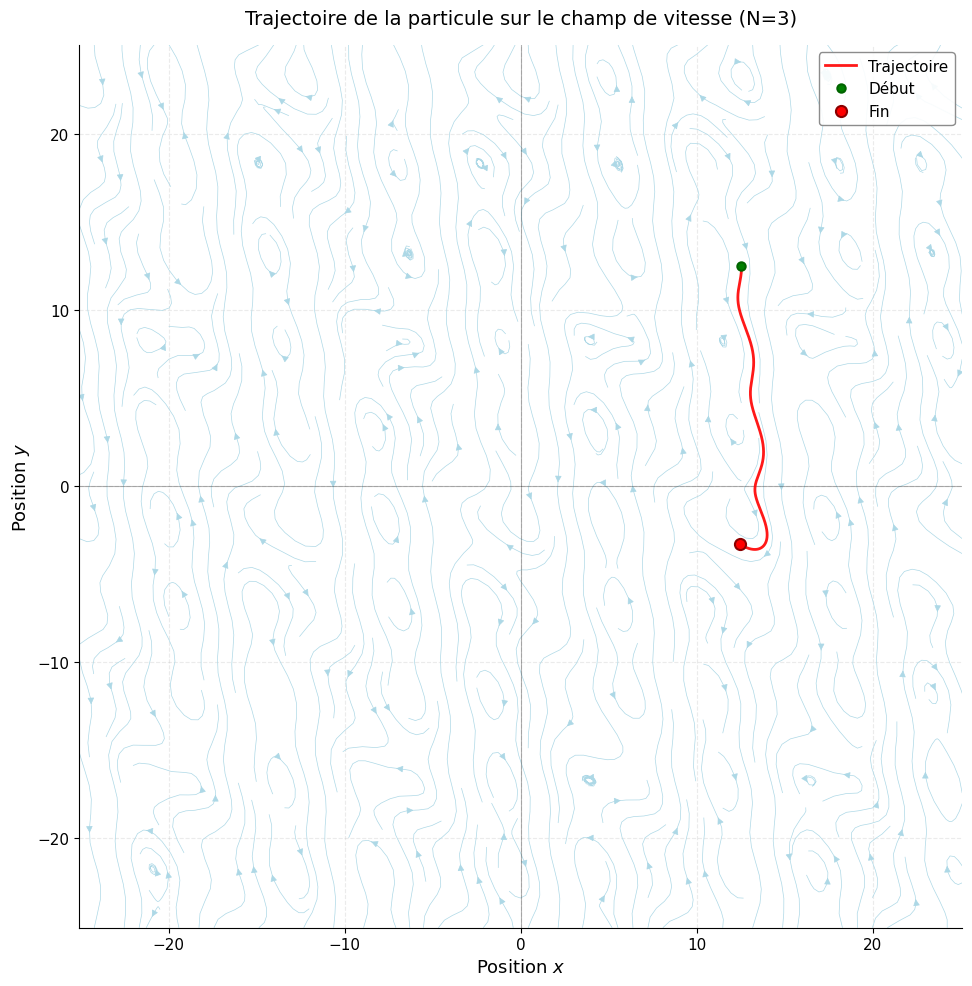

Affichage du portrait de phase...


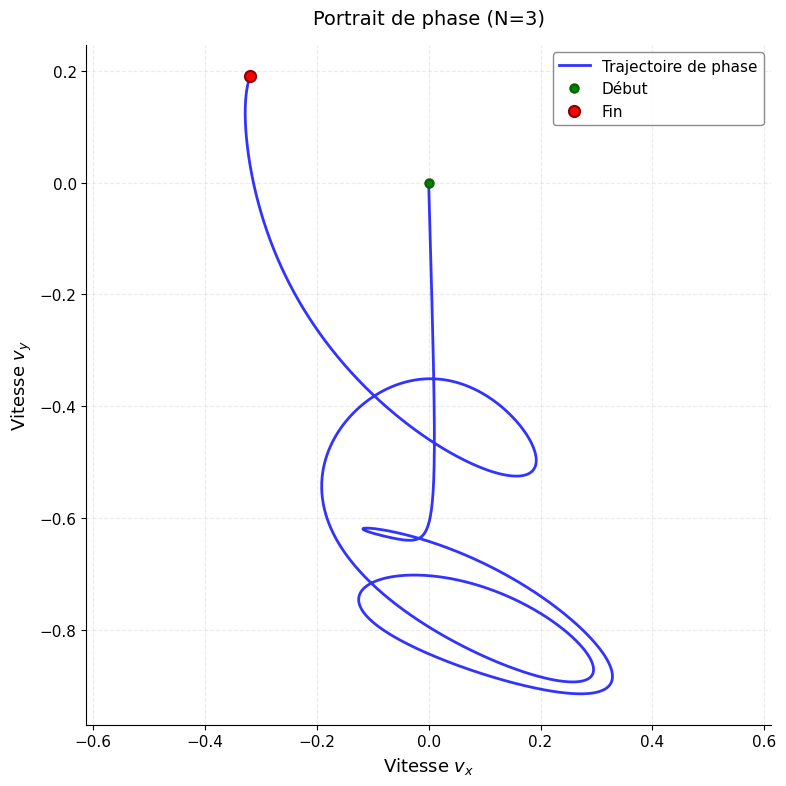

Simulation terminée pour N=3

Cas N = 200
Simulation en cours...
Affichage de la trajectoire sur le champ de vitesse...


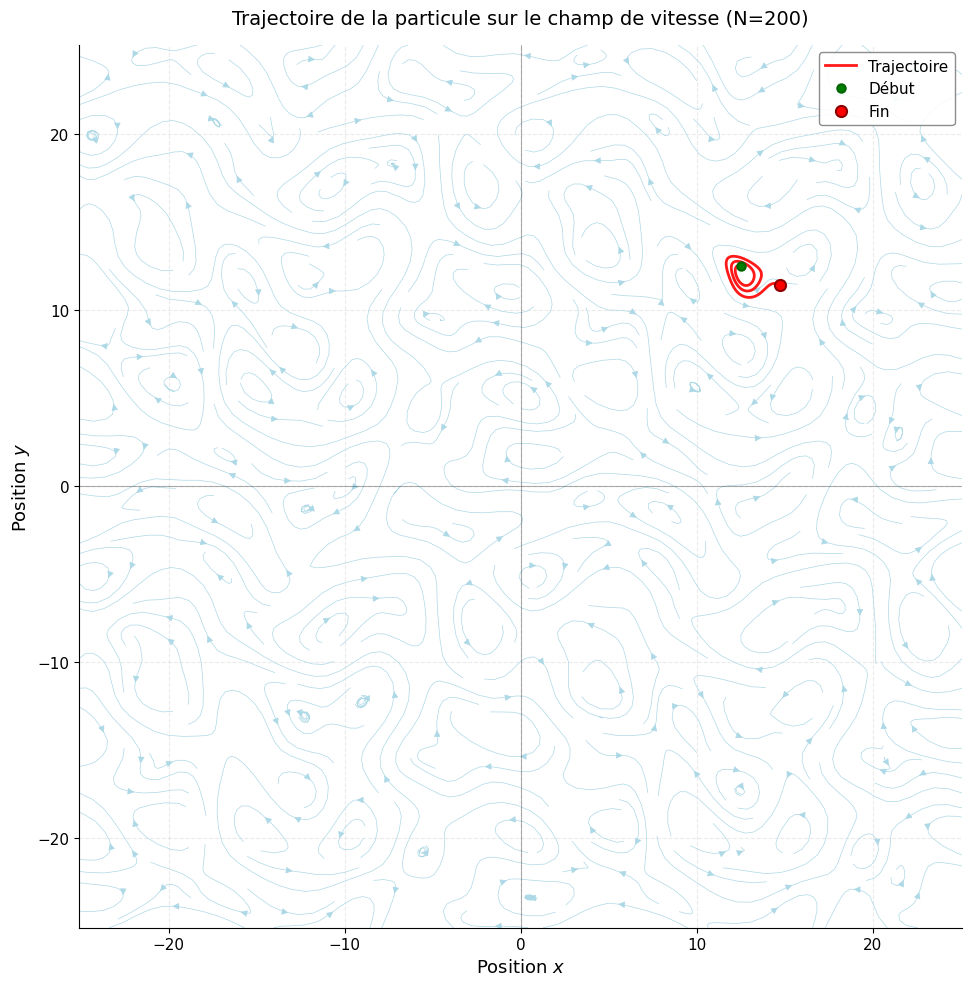

Affichage du portrait de phase...


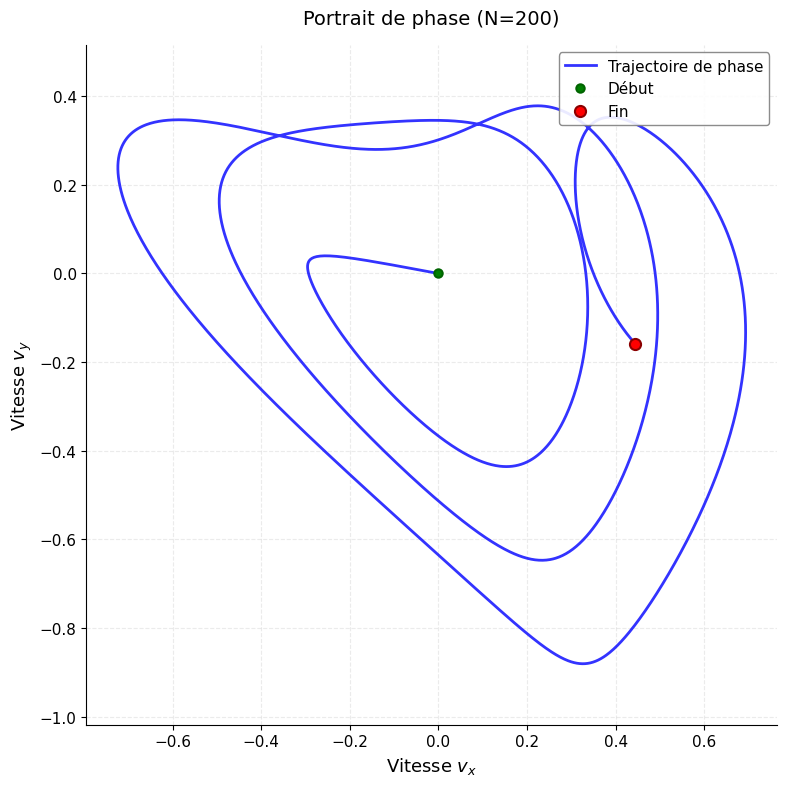

Simulation terminée pour N=200

Cas N = 500
Simulation en cours...
Affichage de la trajectoire sur le champ de vitesse...


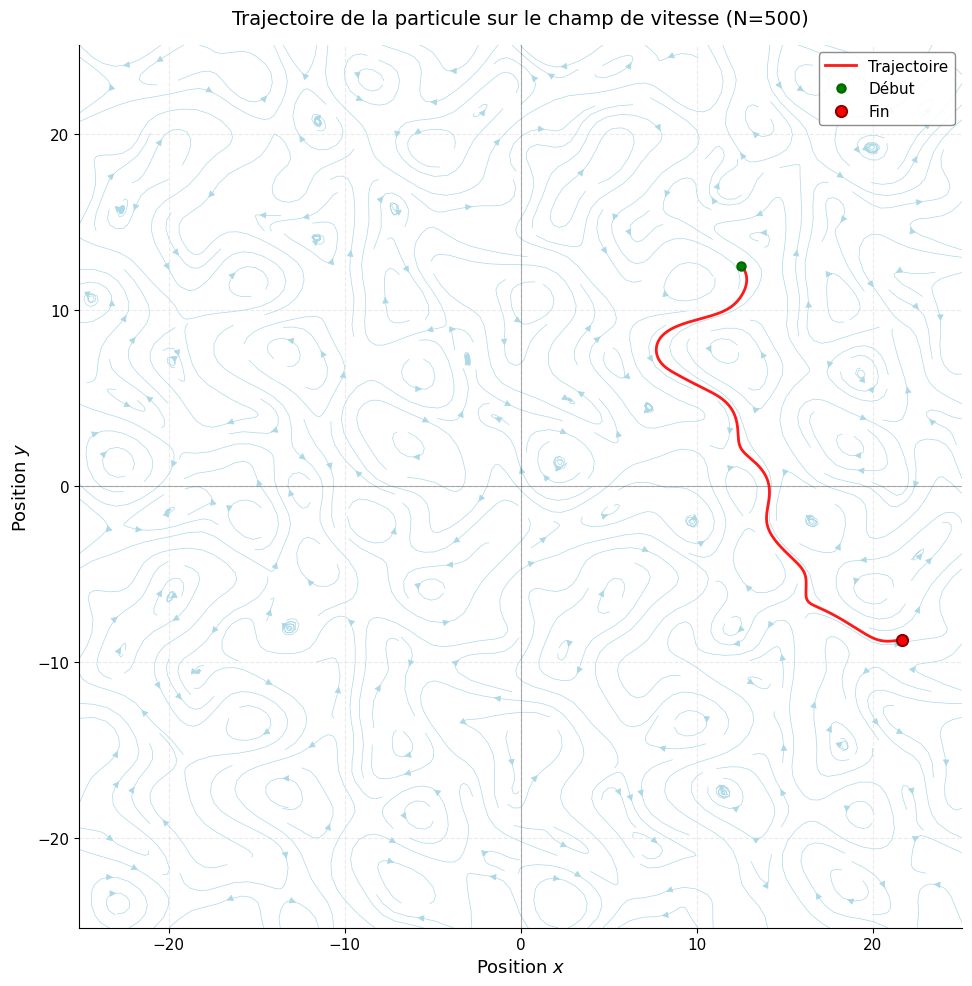

Affichage du portrait de phase...


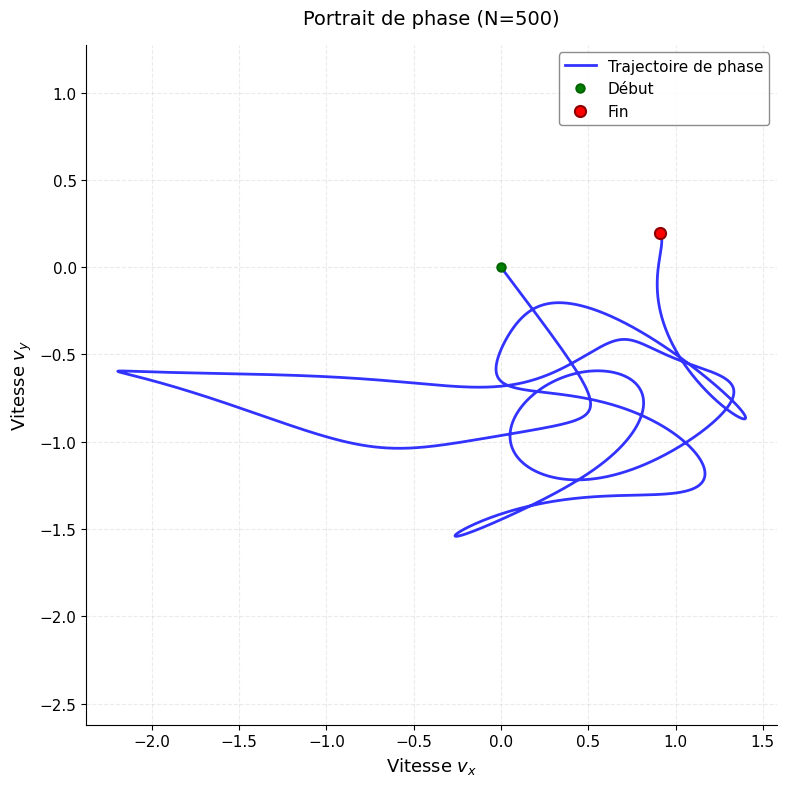

Simulation terminée pour N=500

SIMULATION TERMINÉE!


In [159]:
import numpy as np

L = 10 * np.sqrt(2 * np.pi)  
pos_init = np.array([L/2, L/2])  
vit_init = np.array([0.0, 0.0])  
tau_p = 0.1  
t_end = 30.0  
dt = 0.01  

N_modes_cases = [3, 200,500]

print("="*70)
print("SIMULATION D'UNE PARTICULE UNIQUE DANS UN ÉCOULEMENT TURBULENT 2D")
print("="*70)
print(f"Position initiale: ({pos_init[0]:.2f}, {pos_init[1]:.2f})")
print(f"Vitesse initiale: ({vit_init[0]:.2f}, {vit_init[1]:.2f})")
print(f"Temps de relaxation τ_p: {tau_p}")
print(f"Temps de simulation: t_end = {t_end}")
print("="*70)

results_single = {}

for N_modes in N_modes_cases:
    print(f"\n{'='*70}")
    print(f"Cas N = {N_modes}")
    print(f"{'='*70}")
    

    flow = TurbulentFlow2D(N_modes=N_modes, L=L, seed=42)
    
    print(f"Simulation en cours...")
    t, positions, velocities = simulate_single_particle(
        flow, pos_init, vit_init, tau_p, t_end=t_end, dt=dt
    )
    
    print("Affichage de la trajectoire sur le champ de vitesse...")
    plot_trajectory_on_field(positions, flow, title_suffix=f"(N={N_modes})", resolution=50)
    
    print("Affichage du portrait de phase...")
    plot_phase_portrait(velocities, title_suffix=f"(N={N_modes})")
    
    results_single[f'N={N_modes}'] = {
        't': t,
        'positions': positions,
        'velocities': velocities,
        'flow': flow
    }
    
    print(f"Simulation terminée pour N={N_modes}")

print("\n" + "="*70)
print("SIMULATION TERMINÉE!")
print("="*70)


**Simulation d'écoulement turbulent 2D : TaylorGreen**


Simulation avec τ_p = 0.0199 (St/St_c = 0.5)


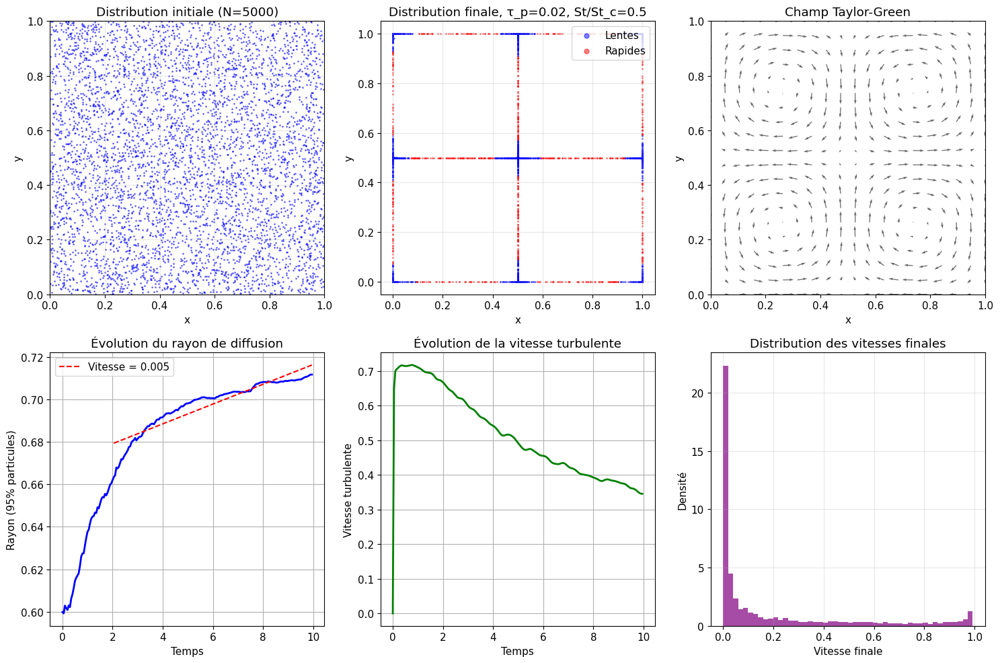


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.020
Stokes critique: St_c = 0.0398
Ratio St/St_c = 0.50

Classification finale:
  Particules lentes (v < 0.5): 4198 (84.0%)
  Particules rapides (v ≥ 0.5): 802 (16.0%)

Vitesse de diffusion estimée: 0.0047
Vitesse turbulente moyenne: 0.4616

Simulation avec τ_p = 0.0398 (St/St_c = 1.0)


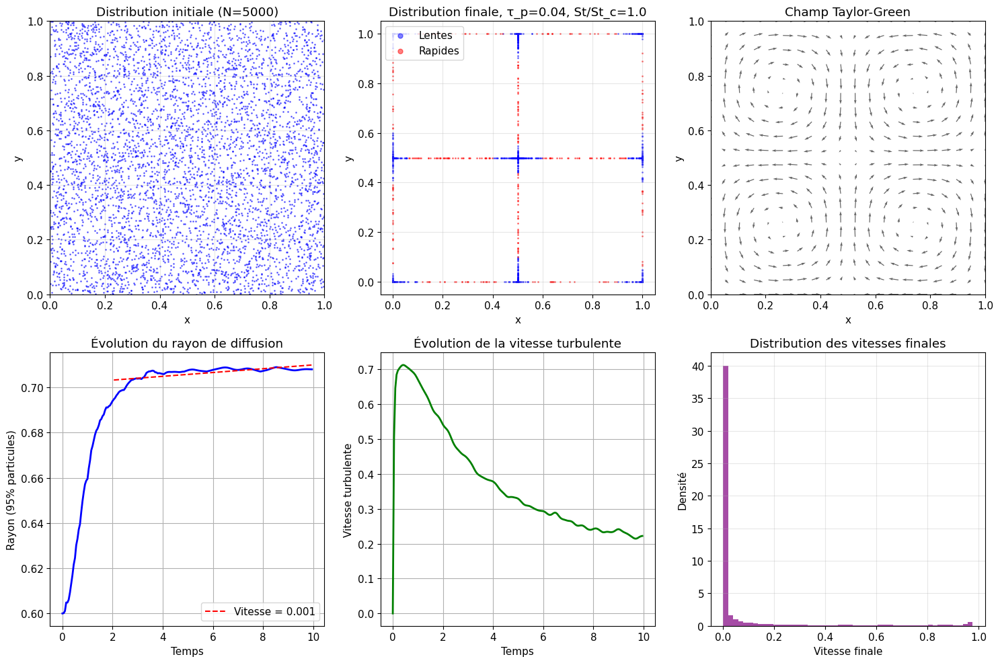


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.040
Stokes critique: St_c = 0.0398
Ratio St/St_c = 1.00

Classification finale:
  Particules lentes (v < 0.5): 4670 (93.4%)
  Particules rapides (v ≥ 0.5): 330 (6.6%)

Vitesse de diffusion estimée: 0.0008
Vitesse turbulente moyenne: 0.3044

Simulation avec τ_p = 0.1989 (St/St_c = 5.0)


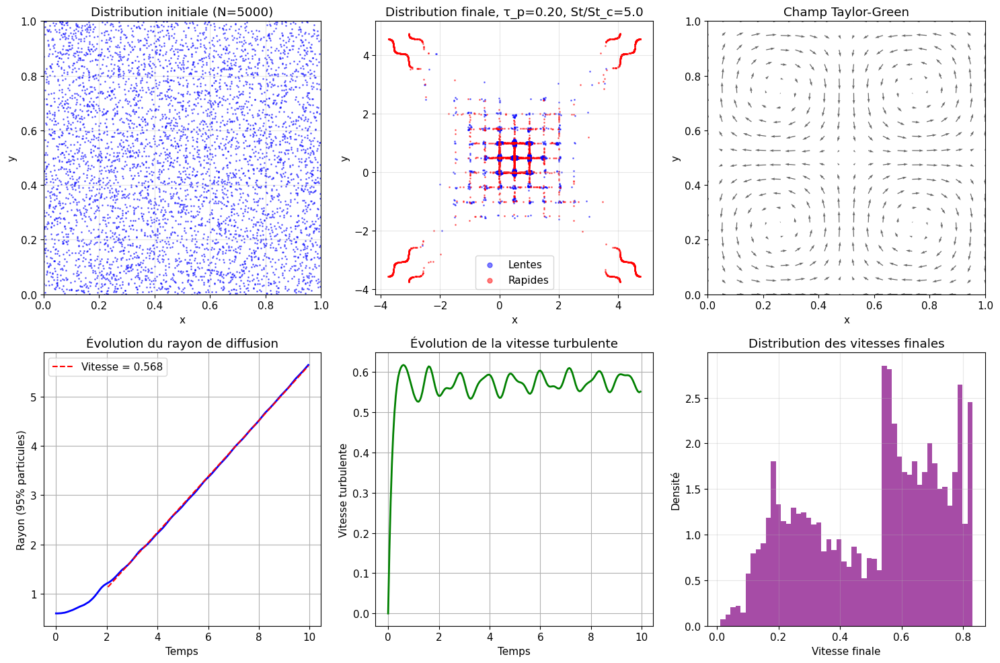


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.199
Stokes critique: St_c = 0.0398
Ratio St/St_c = 5.00

Classification finale:
  Particules lentes (v < 0.5): 2079 (41.6%)
  Particules rapides (v ≥ 0.5): 2921 (58.4%)

Vitesse de diffusion estimée: 0.5680
Vitesse turbulente moyenne: 0.5740


In [2]:
class TaylorGreenParticles:
    """
    Simulation de particules dans un champ de Taylor-Green 2D
    """
    
    def __init__(self, tau_p, N_particles=1000):
        self.tau_p = tau_p
        self.N_particles = N_particles
        self.St_c = 1/(8*np.pi)  # Nombre de Stokes critique
        
        # Initialisation aléatoire des particules
        np.random.seed(42)
        self.positions = np.random.rand(N_particles, 2)  # [0,1] x [0,1]
        self.velocities = np.zeros((N_particles, 2))
        
    def taylor_green_velocity(self, x, y):
        """Champ de vitesse Taylor-Green"""
        u = np.sin(2*np.pi*x) * np.cos(2*np.pi*y)
        v = -np.cos(2*np.pi*x) * np.sin(2*np.pi*y)
        return np.array([u, v])
    
    def equations_particle(self, t, y, i):
        """
        Équations pour une particule individuelle
        y = [x, y, vx, vy]
        """
        x, y_pos, vx, vy = y
        u_fluid = self.taylor_green_velocity(x, y_pos)
        
        dxdt = vx
        dydt = vy
        dvxdt = (u_fluid[0] - vx) / self.tau_p
        dvydt = (u_fluid[1] - vy) / self.tau_p
        
        return [dxdt, dydt, dvxdt, dvydt]
    
    def simulate(self, t_end=10.0, dt=0.01):
        """Simulation de toutes les particules"""
        t_eval = np.arange(0, t_end, dt)
        trajectories = np.zeros((len(t_eval), self.N_particles, 4))
        
        for i in range(self.N_particles):
            y0 = [
                self.positions[i, 0],
                self.positions[i, 1],
                self.velocities[i, 0],
                self.velocities[i, 1]
            ]
            
            sol = solve_ivp(
                lambda t, y: self.equations_particle(t, y, i),
                [0, t_end],
                y0,
                t_eval=t_eval,
                method='RK45',
                rtol=1e-8
            )
            
            trajectories[:, i, :] = sol.y.T
        
        self.trajectories = trajectories
        self.t_eval = t_eval
        return trajectories
    
    def compute_diffusion_radius(self, percentile=95):
        """Calcule le rayon de diffusion contenant le pourcentage donné de particules"""
        radii = []
        
        for t_idx in range(len(self.t_eval)):
            positions = self.trajectories[t_idx, :, :2]
            # Centre de masse
            center = np.mean(positions, axis=0)
            # Distances au centre
            distances = np.linalg.norm(positions - center, axis=1)
            # Rayon contenant le percentile donné
            radius = np.percentile(distances, percentile)
            radii.append(radius)
        
        return np.array(radii)
    
    def compute_turbulent_velocity(self):
        """Calcule la composante turbulente de vitesse"""
        v_turb = []
        
        for t_idx in range(len(self.t_eval)):
            velocities = self.trajectories[t_idx, :, 2:]
            v_mean = np.mean(velocities, axis=0)
            v_prime = velocities - v_mean
            v_turb_mag = np.sqrt(np.mean(np.sum(v_prime**2, axis=1)))
            v_turb.append(v_turb_mag)
        
        return np.array(v_turb)
    
    def classify_particles(self, t_idx=-1):
        """Classifie les particules selon leur comportement"""
        velocities = self.trajectories[t_idx, :, 2:]
        speeds = np.linalg.norm(velocities, axis=1)
        
        # Seuil pour classification
        v_threshold = 0.5
        
        # Classification
        slow_idx = np.where(speeds < v_threshold)[0]
        fast_idx = np.where(speeds >= v_threshold)[0]
        
        return slow_idx, fast_idx
    
    def plot_results(self):
        """Visualisation des résultats"""
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # 1. Distribution initiale
        axes[0,0].scatter(self.positions[:,0], self.positions[:,1], 
                         s=1, alpha=0.5, c='blue')
        axes[0,0].set_xlabel('x')
        axes[0,0].set_ylabel('y')
        axes[0,0].set_title(f'Distribution initiale (N={self.N_particles})')
        axes[0,0].set_xlim(0, 1)
        axes[0,0].set_ylim(0, 1)
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. Distribution finale
        final_positions = self.trajectories[-1, :, :2]
        slow_idx, fast_idx = self.classify_particles()
        
        axes[0,1].scatter(final_positions[slow_idx,0], final_positions[slow_idx,1],
                         s=1, alpha=0.5, c='blue', label='Lentes')
        axes[0,1].scatter(final_positions[fast_idx,0], final_positions[fast_idx,1],
                         s=1, alpha=0.5, c='red', label='Rapides')
        axes[0,1].set_xlabel('x')
        axes[0,1].set_ylabel('y')
        axes[0,1].set_title(f'Distribution finale, τ_p={self.tau_p:.2f}, St/St_c={self.tau_p/self.St_c:.1f}')
        axes[0,1].legend(markerscale=5)
        axes[0,1].grid(True, alpha=0.3)
        
        # 3. Champ de vitesse Taylor-Green
        x_grid, y_grid = np.meshgrid(np.linspace(0, 1, 20), np.linspace(0, 1, 20))
        u_grid = np.sin(2*np.pi*x_grid) * np.cos(2*np.pi*y_grid)
        v_grid = -np.cos(2*np.pi*x_grid) * np.sin(2*np.pi*y_grid)
        
        axes[0,2].quiver(x_grid, y_grid, u_grid, v_grid, alpha=0.6)
        axes[0,2].set_xlabel('x')
        axes[0,2].set_ylabel('y')
        axes[0,2].set_title('Champ Taylor-Green')
        axes[0,2].set_xlim(0, 1)
        axes[0,2].set_ylim(0, 1)
        
        # 4. Rayon de diffusion
        radii_95 = self.compute_diffusion_radius(95)
        axes[1,0].plot(self.t_eval, radii_95, 'b-', linewidth=2)
        axes[1,0].set_xlabel('Temps')
        axes[1,0].set_ylabel('Rayon (95% particules)')
        axes[1,0].set_title('Évolution du rayon de diffusion')
        axes[1,0].grid(True)
        
        # Ajustement linéaire pour la vitesse de diffusion
        if len(self.t_eval) > 10:
            mask = self.t_eval > 2  # Ignorer le régime transitoire
            coeffs = np.polyfit(self.t_eval[mask], radii_95[mask], 1)
            v_diff = coeffs[0]
            axes[1,0].plot(self.t_eval[mask], 
                          coeffs[0]*self.t_eval[mask] + coeffs[1],
                          'r--', label=f'Vitesse = {v_diff:.3f}')
            axes[1,0].legend()
        
        # 5. Vitesse turbulente
        v_turb = self.compute_turbulent_velocity()
        axes[1,1].plot(self.t_eval, v_turb, 'g-', linewidth=2)
        axes[1,1].set_xlabel('Temps')
        axes[1,1].set_ylabel('Vitesse turbulente')
        axes[1,1].set_title('Évolution de la vitesse turbulente')
        axes[1,1].grid(True)
        
        # 6. Distribution des vitesses finales
        final_velocities = self.trajectories[-1, :, 2:]
        final_speeds = np.linalg.norm(final_velocities, axis=1)
        
        axes[1,2].hist(final_speeds, bins=50, alpha=0.7, color='purple', density=True)
        axes[1,2].set_xlabel('Vitesse finale')
        axes[1,2].set_ylabel('Densité')
        axes[1,2].set_title('Distribution des vitesses finales')
        axes[1,2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Affichage des statistiques
        print(f"\n=== STATISTIQUES TAYLOR-GREEN ===")
        print(f"Nombre de Stokes: St = {self.tau_p:.3f}")
        print(f"Stokes critique: St_c = {self.St_c:.4f}")
        print(f"Ratio St/St_c = {self.tau_p/self.St_c:.2f}")
        print(f"\nClassification finale:")
        print(f"  Particules lentes (v < 0.5): {len(slow_idx)} ({100*len(slow_idx)/self.N_particles:.1f}%)")
        print(f"  Particules rapides (v ≥ 0.5): {len(fast_idx)} ({100*len(fast_idx)/self.N_particles:.1f}%)")
        
        if len(self.t_eval) > 10:
            print(f"\nVitesse de diffusion estimée: {v_diff:.4f}")
            print(f"Vitesse turbulente moyenne: {np.mean(v_turb[50:]):.4f}")  # Après transitoire

# Simulation pour différents nombres de Stokes
def run_taylor_green_comparison():
    """Compare différents nombres de Stokes"""
    
    St_ratios = [0.5, 1.0, 5.0]  # Multiples de St_c
    St_c = 1/(8*np.pi)
    
    for ratio in St_ratios:
        tau_p = ratio * St_c
        print(f"\n{'='*60}")
        print(f"Simulation avec τ_p = {tau_p:.4f} (St/St_c = {ratio})")
        print(f"{'='*60}")
        
        simulator = TaylorGreenParticles(tau_p=tau_p, N_particles=5000)
        simulator.simulate(t_end=10.0, dt=0.05)
        simulator.plot_results()

if __name__ == "__main__":
    # Exécuter la comparaison
    run_taylor_green_comparison()

(0.0, 1.0)

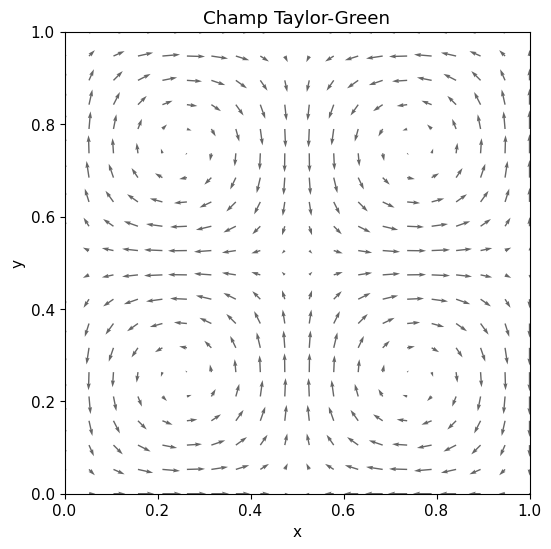

In [3]:
x_grid, y_grid = np.meshgrid(np.linspace(0, 1, 20), np.linspace(0, 1, 20))
u_grid = np.sin(2*np.pi*x_grid) * np.cos(2*np.pi*y_grid)
v_grid = -np.cos(2*np.pi*x_grid) * np.sin(2*np.pi*y_grid)

plt.figure(figsize=(6,6))
plt.quiver(x_grid, y_grid, u_grid, v_grid, alpha=0.6)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Champ Taylor-Green')
plt.xlim(0, 1)
plt.ylim(0, 1)

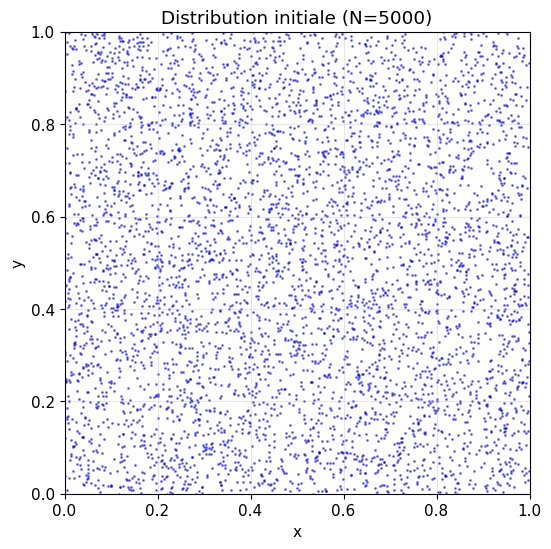

In [4]:
#Distribution initiale (5000 particules)
np.random.seed(42)
N_particles = 5000
positions = np.random.rand(N_particles, 2)  # [0,1] x [0,1]
plt.figure(figsize=(6,6))
plt.scatter(positions[:,0], positions[:,1], s=1, alpha=0.5, c='blue')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Distribution initiale (N=5000)')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid(True, alpha=0.3)


Simulation avec τ_p = 0.01989 (St/St_c = 0.5)
SANS modulo


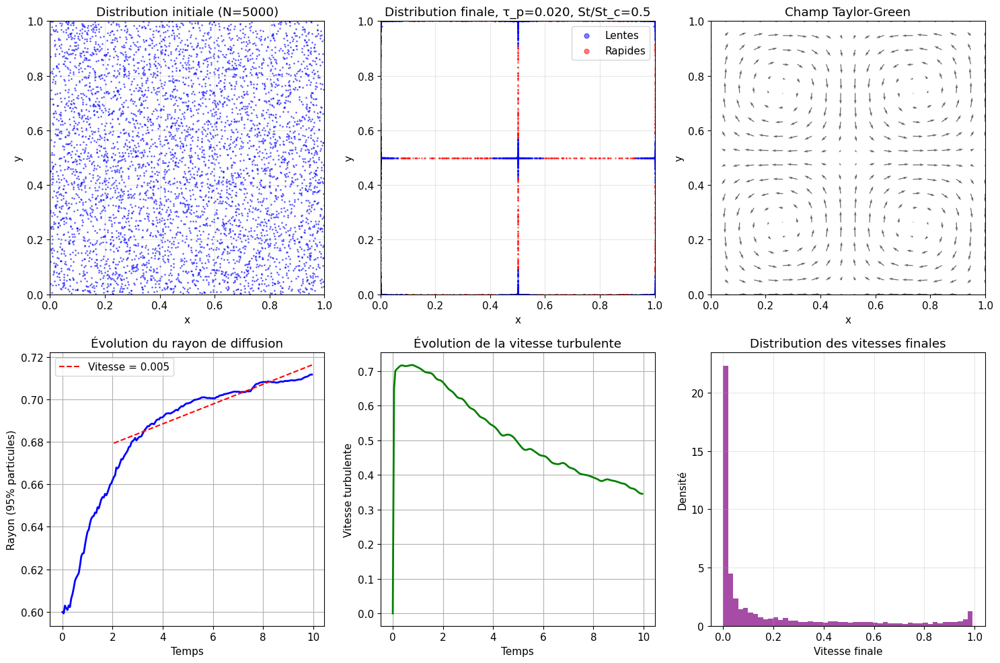


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.01989
Stokes critique: St_c = 0.03979
Ratio St/St_c = 0.50
Modulo appliqué: Non

Classification finale:
  Particules lentes (v < 0.5): 4198 (84.0%)
  Particules rapides (v ≥ 0.5): 802 (16.0%)

Vitesse de diffusion estimée: 0.0047
Vitesse turbulente moyenne: 0.4616

Statistiques spatiales (après modulo si appliqué):
  Position x moyenne: 0.490
  Position y moyenne: 0.501
  Écart-type x: 0.347
  Écart-type y: 0.347

Simulation avec τ_p = 0.03979 (St/St_c = 1.0)
SANS modulo


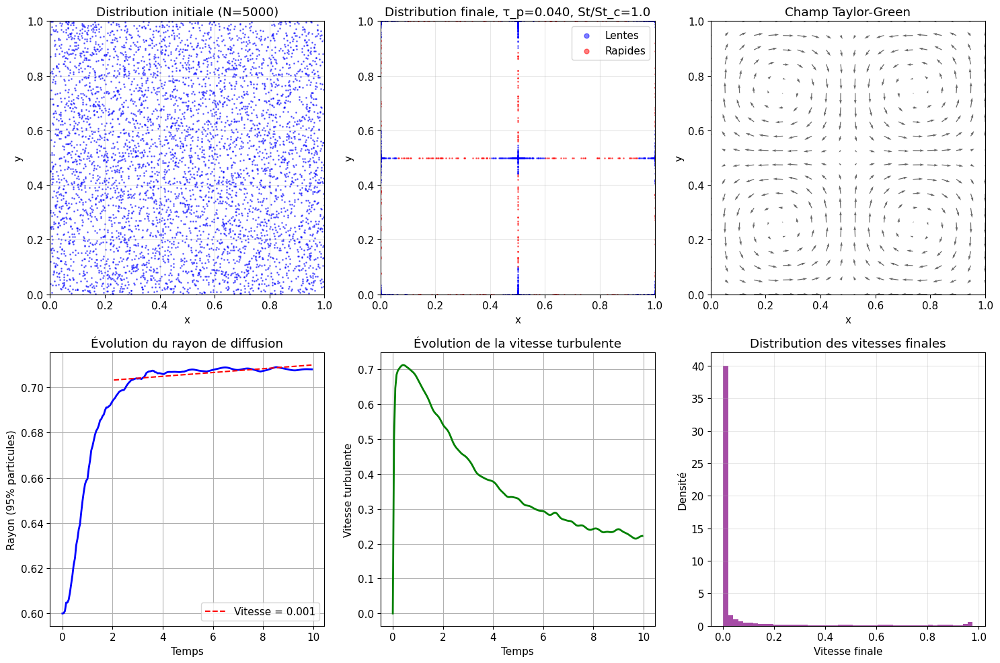


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.03979
Stokes critique: St_c = 0.03979
Ratio St/St_c = 1.00
Modulo appliqué: Non

Classification finale:
  Particules lentes (v < 0.5): 4670 (93.4%)
  Particules rapides (v ≥ 0.5): 330 (6.6%)

Vitesse de diffusion estimée: 0.0008
Vitesse turbulente moyenne: 0.3044

Statistiques spatiales (après modulo si appliqué):
  Position x moyenne: 0.500
  Position y moyenne: 0.498
  Écart-type x: 0.352
  Écart-type y: 0.352

Simulation avec τ_p = 0.19894 (St/St_c = 5.0)
SANS modulo


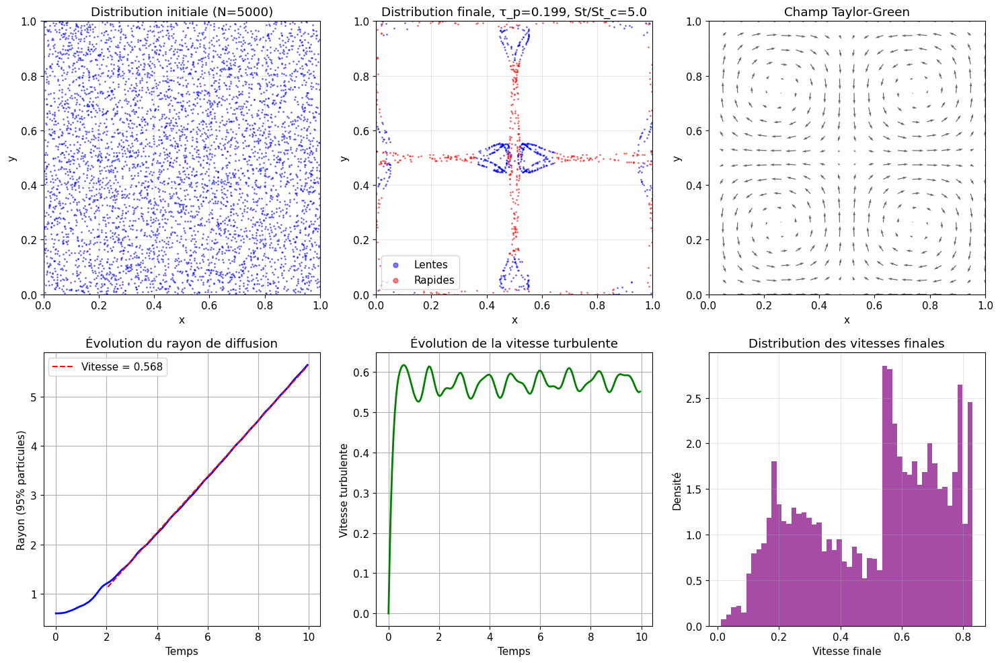


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.19894
Stokes critique: St_c = 0.03979
Ratio St/St_c = 5.00
Modulo appliqué: Non

Classification finale:
  Particules lentes (v < 0.5): 2079 (41.6%)
  Particules rapides (v ≥ 0.5): 2921 (58.4%)

Vitesse de diffusion estimée: 0.5680
Vitesse turbulente moyenne: 0.5740

Statistiques spatiales (après modulo si appliqué):
  Position x moyenne: 0.544
  Position y moyenne: 0.491
  Écart-type x: 2.206
  Écart-type y: 2.201

Simulation avec τ_p = 0.19894 (St/St_c = 5.0)
AVEC modulo (conditions périodiques)


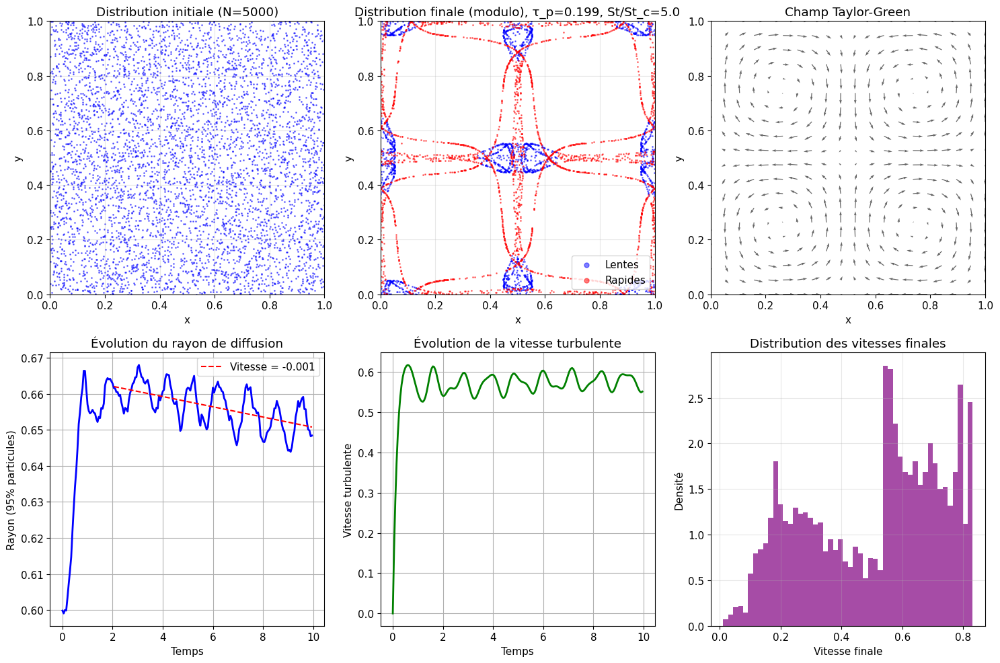


=== STATISTIQUES TAYLOR-GREEN ===
Nombre de Stokes: St = 0.19894
Stokes critique: St_c = 0.03979
Ratio St/St_c = 5.00
Modulo appliqué: Oui

Classification finale:
  Particules lentes (v < 0.5): 2079 (41.6%)
  Particules rapides (v ≥ 0.5): 2921 (58.4%)

Vitesse de diffusion estimée: -0.0014
Vitesse turbulente moyenne: 0.5740

Statistiques spatiales (après modulo si appliqué):
  Position x moyenne: 0.501
  Position y moyenne: 0.501
  Écart-type x: 0.315
  Écart-type y: 0.310


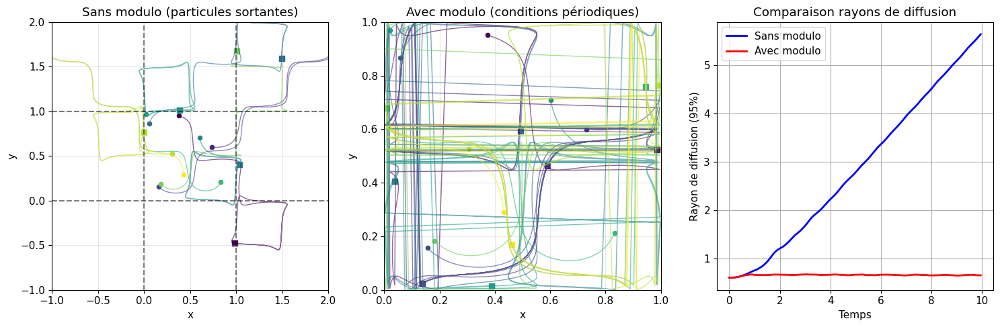

In [5]:
class TaylorGreenParticles:
    """
    Simulation de particules dans un champ de Taylor-Green 2D
    """
    
    def __init__(self, tau_p, N_particles=1000, use_modulo=False):
        self.tau_p = tau_p
        self.N_particles = N_particles
        self.St_c = 1/(8*np.pi)  # Nombre de Stokes critique
        self.use_modulo = use_modulo  # Nouveau: appliquer modulo pour les bords
        
        # Initialisation aléatoire des particules
        np.random.seed(42)
        self.positions = np.random.rand(N_particles, 2)  # [0,1] x [0,1]
        self.velocities = np.zeros((N_particles, 2))
        
    def taylor_green_velocity(self, x, y):
        """Champ de vitesse Taylor-Green"""
        u = np.sin(2*np.pi*x) * np.cos(2*np.pi*y)
        v = -np.cos(2*np.pi*x) * np.sin(2*np.pi*y)
        return np.array([u, v])
    
    def equations_particle(self, t, y, i):
        """
        Équations pour une particule individuelle
        y = [x, y, vx, vy]
        """
        x, y_pos, vx, vy = y
        
        # Appliquer modulo si activé et si particule sort du domaine
        if self.use_modulo:
            x_mod = x % 1.0
            y_mod = y_pos % 1.0
            u_fluid = self.taylor_green_velocity(x_mod, y_mod)
        else:
            u_fluid = self.taylor_green_velocity(x, y_pos)
        
        dxdt = vx
        dydt = vy
        dvxdt = (u_fluid[0] - vx) / self.tau_p
        dvydt = (u_fluid[1] - vy) / self.tau_p
        
        return [dxdt, dydt, dvxdt, dvydt]
    
    def simulate(self, t_end=10.0, dt=0.01):
        """Simulation de toutes les particules"""
        t_eval = np.arange(0, t_end, dt)
        trajectories = np.zeros((len(t_eval), self.N_particles, 4))
        
        for i in range(self.N_particles):
            y0 = [
                self.positions[i, 0],
                self.positions[i, 1],
                self.velocities[i, 0],
                self.velocities[i, 1]
            ]
            
            sol = solve_ivp(
                lambda t, y: self.equations_particle(t, y, i),
                [0, t_end],
                y0,
                t_eval=t_eval,
                method='RK45',
                rtol=1e-8
            )
            
            trajectories[:, i, :] = sol.y.T
        
        self.trajectories = trajectories
        self.t_eval = t_eval
        return trajectories
    
    def get_positions_with_modulo(self, t_idx=-1):
        """Retourne les positions avec modulo appliqué si nécessaire"""
        positions = self.trajectories[t_idx, :, :2].copy()
        if self.use_modulo:
            positions[:, 0] = positions[:, 0] % 1.0
            positions[:, 1] = positions[:, 1] % 1.0
        return positions
    
    def compute_diffusion_radius(self, percentile=95):
        """Calcule le rayon de diffusion contenant le pourcentage donné de particules"""
        radii = []
        
        for t_idx in range(len(self.t_eval)):
            positions = self.get_positions_with_modulo(t_idx)
            # Centre de masse
            center = np.mean(positions, axis=0)
            # Distances au centre
            distances = np.linalg.norm(positions - center, axis=1)
            # Rayon contenant le percentile donné
            radius = np.percentile(distances, percentile)
            radii.append(radius)
        
        return np.array(radii)
    
    def compute_turbulent_velocity(self):
        """Calcule la composante turbulente de vitesse"""
        v_turb = []
        
        for t_idx in range(len(self.t_eval)):
            velocities = self.trajectories[t_idx, :, 2:]
            v_mean = np.mean(velocities, axis=0)
            v_prime = velocities - v_mean
            v_turb_mag = np.sqrt(np.mean(np.sum(v_prime**2, axis=1)))
            v_turb.append(v_turb_mag)
        
        return np.array(v_turb)
    
    def classify_particles(self, t_idx=-1):
        """Classifie les particules selon leur comportement"""
        velocities = self.trajectories[t_idx, :, 2:]
        speeds = np.linalg.norm(velocities, axis=1)
        
        # Seuil pour classification
        v_threshold = 0.5
        
        # Classification
        slow_idx = np.where(speeds < v_threshold)[0]
        fast_idx = np.where(speeds >= v_threshold)[0]
        
        return slow_idx, fast_idx
    
    def plot_results(self):
        """Visualisation des résultats"""
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # 1. Distribution initiale
        axes[0,0].scatter(self.positions[:,0], self.positions[:,1], 
                         s=1, alpha=0.5, c='blue')
        axes[0,0].set_xlabel('x')
        axes[0,0].set_ylabel('y')
        axes[0,0].set_title(f'Distribution initiale (N={self.N_particles})')
        axes[0,0].set_xlim(0, 1)
        axes[0,0].set_ylim(0, 1)
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. Distribution finale (avec modulo si applicable)
        final_positions = self.get_positions_with_modulo(-1)
        slow_idx, fast_idx = self.classify_particles()
        
        axes[0,1].scatter(final_positions[slow_idx,0], final_positions[slow_idx,1],
                         s=1, alpha=0.5, c='blue', label='Lentes')
        axes[0,1].scatter(final_positions[fast_idx,0], final_positions[fast_idx,1],
                         s=1, alpha=0.5, c='red', label='Rapides')
        axes[0,1].set_xlabel('x')
        axes[0,1].set_ylabel('y')
        axes[0,1].set_title(f'Distribution finale, τ_p={self.tau_p:.3f}, St/St_c={self.tau_p/self.St_c:.1f}')
        if self.use_modulo:
            axes[0,1].set_title(f'Distribution finale (modulo), τ_p={self.tau_p:.3f}, St/St_c={self.tau_p/self.St_c:.1f}')
        axes[0,1].legend(markerscale=5)
        axes[0,1].grid(True, alpha=0.3)
        axes[0,1].set_xlim(0, 1)
        axes[0,1].set_ylim(0, 1)
        
        # 3. Champ de vitesse Taylor-Green
        x_grid, y_grid = np.meshgrid(np.linspace(0, 1, 20), np.linspace(0, 1, 20))
        u_grid = np.sin(2*np.pi*x_grid) * np.cos(2*np.pi*y_grid)
        v_grid = -np.cos(2*np.pi*x_grid) * np.sin(2*np.pi*y_grid)
        
        axes[0,2].quiver(x_grid, y_grid, u_grid, v_grid, alpha=0.6)
        axes[0,2].set_xlabel('x')
        axes[0,2].set_ylabel('y')
        axes[0,2].set_title('Champ Taylor-Green')
        axes[0,2].set_xlim(0, 1)
        axes[0,2].set_ylim(0, 1)
        
        # 4. Rayon de diffusion
        radii_95 = self.compute_diffusion_radius(95)
        axes[1,0].plot(self.t_eval, radii_95, 'b-', linewidth=2)
        axes[1,0].set_xlabel('Temps')
        axes[1,0].set_ylabel('Rayon (95% particules)')
        axes[1,0].set_title('Évolution du rayon de diffusion')
        axes[1,0].grid(True)
        
        # Ajustement linéaire pour la vitesse de diffusion
        if len(self.t_eval) > 10:
            mask = self.t_eval > 2  # Ignorer le régime transitoire
            coeffs = np.polyfit(self.t_eval[mask], radii_95[mask], 1)
            v_diff = coeffs[0]
            axes[1,0].plot(self.t_eval[mask], 
                          coeffs[0]*self.t_eval[mask] + coeffs[1],
                          'r--', label=f'Vitesse = {v_diff:.3f}')
            axes[1,0].legend()
        
        # 5. Vitesse turbulente
        v_turb = self.compute_turbulent_velocity()
        axes[1,1].plot(self.t_eval, v_turb, 'g-', linewidth=2)
        axes[1,1].set_xlabel('Temps')
        axes[1,1].set_ylabel('Vitesse turbulente')
        axes[1,1].set_title('Évolution de la vitesse turbulente')
        axes[1,1].grid(True)
        
        # 6. Distribution des vitesses finales
        final_velocities = self.trajectories[-1, :, 2:]
        final_speeds = np.linalg.norm(final_velocities, axis=1)
        
        axes[1,2].hist(final_speeds, bins=50, alpha=0.7, color='purple', density=True)
        axes[1,2].set_xlabel('Vitesse finale')
        axes[1,2].set_ylabel('Densité')
        axes[1,2].set_title('Distribution des vitesses finales')
        axes[1,2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Affichage des statistiques
        print(f"\n=== STATISTIQUES TAYLOR-GREEN ===")
        print(f"Nombre de Stokes: St = {self.tau_p:.5f}")
        print(f"Stokes critique: St_c = {self.St_c:.5f}")
        print(f"Ratio St/St_c = {self.tau_p/self.St_c:.2f}")
        print(f"Modulo appliqué: {'Oui' if self.use_modulo else 'Non'}")
        print(f"\nClassification finale:")
        print(f"  Particules lentes (v < 0.5): {len(slow_idx)} ({100*len(slow_idx)/self.N_particles:.1f}%)")
        print(f"  Particules rapides (v ≥ 0.5): {len(fast_idx)} ({100*len(fast_idx)/self.N_particles:.1f}%)")
        
        if len(self.t_eval) > 10:
            print(f"\nVitesse de diffusion estimée: {v_diff:.4f}")
            print(f"Vitesse turbulente moyenne: {np.mean(v_turb[50:]):.4f}")  # Après transitoire
            
        # Statistiques sur les positions (avec modulo)
        final_positions_mod = self.get_positions_with_modulo(-1)
        print(f"\nStatistiques spatiales (après modulo si appliqué):")
        print(f"  Position x moyenne: {np.mean(final_positions_mod[:,0]):.3f}")
        print(f"  Position y moyenne: {np.mean(final_positions_mod[:,1]):.3f}")
        print(f"  Écart-type x: {np.std(final_positions_mod[:,0]):.3f}")
        print(f"  Écart-type y: {np.std(final_positions_mod[:,1]):.3f}")

# Simulation pour différents nombres de Stokes
def run_taylor_green_comparison():
    """Compare différents nombres de Stokes"""
    
    St_ratios = [0.5, 1.0, 5.0]  # Multiples de St_c
    St_c = 1/(8*np.pi)
    
    for ratio in St_ratios:
        tau_p = ratio * St_c
        
        print(f"\n{'='*60}")
        print(f"Simulation avec τ_p = {tau_p:.5f} (St/St_c = {ratio})")
        print(f"SANS modulo")
        print(f"{'='*60}")
        
        simulator = TaylorGreenParticles(tau_p=tau_p, N_particles=5000, use_modulo=False)
        simulator.simulate(t_end=10.0, dt=0.05)
        simulator.plot_results()
        
        # Pour le cas St = 5 St_c, exécuter aussi avec modulo
        if ratio == 5.0:
            print(f"\n{'='*60}")
            print(f"Simulation avec τ_p = {tau_p:.5f} (St/St_c = {ratio})")
            print(f"AVEC modulo (conditions périodiques)")
            print(f"{'='*60}")
            
            simulator_mod = TaylorGreenParticles(tau_p=tau_p, N_particles=5000, use_modulo=True)
            simulator_mod.simulate(t_end=10.0, dt=0.05)
            simulator_mod.plot_results()
            
            # Comparaison visuelle supplémentaire
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            
            # Trajectoires de quelques particules
            n_sample = 10
            colors = plt.cm.viridis(np.linspace(0, 1, n_sample))
            
            for i in range(n_sample):
                # Sans modulo
                traj = simulator.trajectories[:, i, :2]
                axes[0].plot(traj[:, 0], traj[:, 1], alpha=0.6, color=colors[i], linewidth=1)
                axes[0].scatter(traj[0, 0], traj[0, 1], color=colors[i], s=20, marker='o')
                axes[0].scatter(traj[-1, 0], traj[-1, 1], color=colors[i], s=40, marker='s')
                
                # Avec modulo
                traj_mod = simulator_mod.trajectories[:, i, :2]
                axes[1].plot(traj_mod[:, 0] % 1.0, traj_mod[:, 1] % 1.0, alpha=0.6, color=colors[i], linewidth=1)
                axes[1].scatter(traj_mod[0, 0] % 1.0, traj_mod[0, 1] % 1.0, color=colors[i], s=20, marker='o')
                axes[1].scatter(traj_mod[-1, 0] % 1.0, traj_mod[-1, 1] % 1.0, color=colors[i], s=40, marker='s')
            
            axes[0].set_xlim(-1, 2)
            axes[0].set_ylim(-1, 2)
            axes[0].set_xlabel('x')
            axes[0].set_ylabel('y')
            axes[0].set_title('Sans modulo (particules sortantes)')
            axes[0].grid(True, alpha=0.3)
            axes[0].axvline(x=0, color='k', linestyle='--', alpha=0.5)
            axes[0].axvline(x=1, color='k', linestyle='--', alpha=0.5)
            axes[0].axhline(y=0, color='k', linestyle='--', alpha=0.5)
            axes[0].axhline(y=1, color='k', linestyle='--', alpha=0.5)
            
            axes[1].set_xlim(0, 1)
            axes[1].set_ylim(0, 1)
            axes[1].set_xlabel('x')
            axes[1].set_ylabel('y')
            axes[1].set_title('Avec modulo (conditions périodiques)')
            axes[1].grid(True, alpha=0.3)
            
            # Comparaison des rayons de diffusion
            radii_no_mod = simulator.compute_diffusion_radius(95)
            radii_mod = simulator_mod.compute_diffusion_radius(95)
            
            axes[2].plot(simulator.t_eval, radii_no_mod, 'b-', label='Sans modulo', linewidth=2)
            axes[2].plot(simulator_mod.t_eval, radii_mod, 'r-', label='Avec modulo', linewidth=2)
            axes[2].set_xlabel('Temps')
            axes[2].set_ylabel('Rayon de diffusion (95%)')
            axes[2].set_title('Comparaison rayons de diffusion')
            axes[2].legend()
            axes[2].grid(True)
            
            plt.tight_layout()
            plt.show()

if __name__ == "__main__":
    # Exécuter la comparaison
    run_taylor_green_comparison()